In [1]:
import dut_func as dut
import serial
import time
import struct
import numpy as np
# from bitarray import bitarray
from bitstring import BitArray
import matplotlib.pyplot as plt
%config InlineBackend.figure_formats = ['svg']
import dut_a0 as a0

from misc import *

In [2]:
from dpe import DPE
dpe = DPE('COM3')

DAC initialized to a span from -10 V to 10 V
Setting vrefs to default


In [3]:
dpe.set_clock(50)

Setting ADC_CK freq=50000.0kHz
Setting CK_ARRAY freq=50000.0kHz


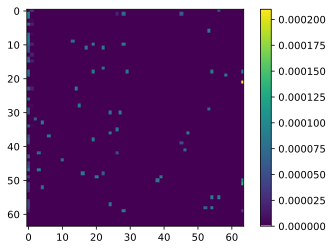

In [4]:
plt.imshow(dpe.read(2))
plt.colorbar()

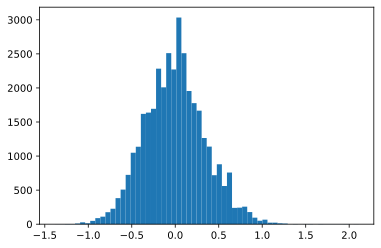

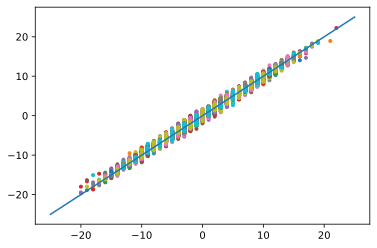

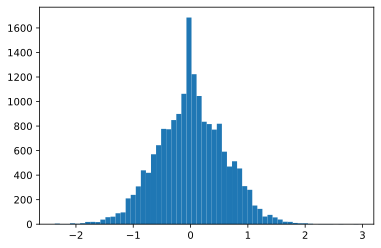

In [17]:
from lib_data import *
import scipy.io as sio
mat_contents = sio.loadmat('Exported60Node_GraphNum0.mat')
CMat = mat_contents['A']

CMat[0,33] = 0
CMat[33,0] = 0

import dut_func as dut
import time
import struct
import matplotlib
import matplotlib.pyplot as plt
from dpe import DPE
from lib_data import *
from lib_nn_dpe import NN_dpe
from IPython import display

#from lib_data import *
#import scipy.io as sio
#mat_contents = sio.loadmat('Exported60Node_GraphNum0.mat')
#CMat = mat_contents['A']

arr = 2
dpe.N_BIT = 1

numTests = 300
appliedVector1 = np.zeros((64,numTests))
appliedVector2 = np.zeros((64,numTests))
randomVector = np.random.randint(2, size=(60,numTests))

appliedVector1[0:60,:] = randomVector[:,:]
appliedVector2[0:60,:] = 1-randomVector[:,:]
neuronVector = appliedVector1[0:60,:] - appliedVector2[0:60,:]

output1  = dpe.multiply_w_delay(arr, appliedVector1, c_sel=[0, 60], mode=1, debug=False, delay=5)
output2  = dpe.multiply_w_delay(arr, appliedVector2, c_sel=[0, 60], mode=1, debug=False, delay=5)
all_output = np.concatenate((output1, output2))

#SW_output = neuronVector * CMat
#SW_neuron = np.matmul(neuronVector, CMat)
SW_output1 = (CMat.T @ appliedVector1[0:60,:]).T 
SW_output2 = (CMat.T @ appliedVector2[0:60,:]).T 
all_SW_output = np.concatenate((SW_output1, SW_output2))

lin_corrs_allcols = []
for c in range(60):
    lin_corrs_allcols.append( np.polyfit(all_output[:,c], all_SW_output[:,c], 1))

output_corr  = dpe.lin_corr(all_output, lin_corrs_allcols)
output_corr1 = dpe.lin_corr(output1, lin_corrs_allcols)
output_corr2 = dpe.lin_corr(output2, lin_corrs_allcols)
exp_neuron_output = output_corr1 - output_corr2
SW_neuron_output = SW_output1 - SW_output2

error = output_corr - all_SW_output
fig, ax = plt.subplots()
for c in range(60):
    x = all_SW_output[:,c]
    y = output_corr[:,c]    
    ax.plot(x,y,'.')
zz = np.linspace(0,30,30)  
ax.plot(zz,zz,'-')

fig, ax = plt.subplots()
ax.hist(error.flatten(),bins=60);

fig, ax = plt.subplots()
for c in range(60):
    x = SW_neuron_output[:,c]
    y = exp_neuron_output[:,c]    
    ax.plot(x,y,'.')   
zz = np.linspace(-25,25,50)    
ax.plot(zz,zz,'-')  

fig, ax = plt.subplots()
err_neuron = exp_neuron_output.flatten() - SW_neuron_output.flatten()
ax.hist(err_neuron.flatten(),bins=60);

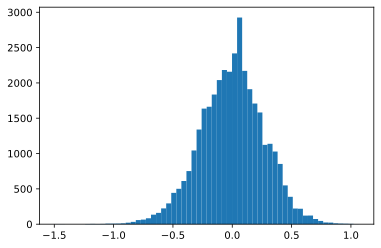

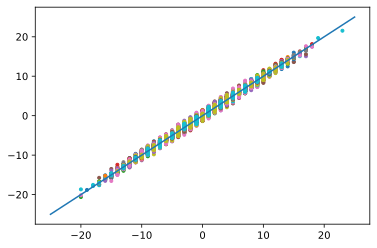

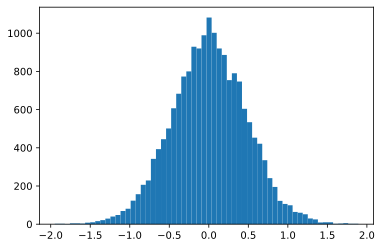

In [8]:
# NOW TRY TAKING THE DATA ONLY ONE COLUMN AT A TIME TO SEE IF WE GET BETTER ACCURACY
from lib_data import *
import scipy.io as sio
mat_contents = sio.loadmat('Exported60Node_GraphNum0.mat')
CMat = mat_contents['A']

CMat[0,33] = 0
CMat[33,0] = 0

import dut_func as dut
import time
import struct
import matplotlib
import matplotlib.pyplot as plt

from dpe import DPE
from lib_data import *
from lib_nn_dpe import NN_dpe
from IPython import display

arr = 2
dpe.N_BIT = 1

numTests = 300
appliedVector1 = np.zeros((64,numTests))
appliedVector2 = np.zeros((64,numTests))
randomVector = np.random.randint(2, size=(60,numTests))

appliedVector1[0:60,:] = randomVector[:,:]
appliedVector2[0:60,:] = 1-randomVector[:,:]
neuronVector = appliedVector1[0:60,:] - appliedVector2[0:60,:]

output1 = np.zeros((numTests,60))
output2 = np.zeros((numTests,60))
for c in range(60):
    output1[:,c]  = dpe.multiply_w_delay(arr, appliedVector1, c_sel=[c,c+1], mode=1, debug=False, delay=5).T
    output2[:,c]  = dpe.multiply_w_delay(arr, appliedVector2, c_sel=[c,c+1], mode=1, debug=False, delay=5).T
    
all_output = np.concatenate((output1, output2))

#SW_output = neuronVector * CMat
#SW_neuron = np.matmul(neuronVector, CMat)
SW_output1 = (CMat.T @ appliedVector1[0:60,:]).T 
SW_output2 = (CMat.T @ appliedVector2[0:60,:]).T 
all_SW_output = np.concatenate((SW_output1, SW_output2))

lin_corrs = []
for c in range(60):
    lin_corrs.append( np.polyfit(all_output[:,c], all_SW_output[:,c], 1))

output_corr  = dpe.lin_corr(all_output, lin_corrs)
output_corr1 = dpe.lin_corr(output1, lin_corrs)
output_corr2 = dpe.lin_corr(output2, lin_corrs)
exp_neuron_output = output_corr1 - output_corr2
SW_neuron_output = SW_output1 - SW_output2

error = output_corr - all_SW_output
fig, ax = plt.subplots()
for c in range(60):
    x = all_SW_output[:,c]
    y = output_corr[:,c]    
    ax.plot(x,y,'.')
zz = np.linspace(0,30,30)  
ax.plot(zz,zz,'-')

fig, ax = plt.subplots()
ax.hist(error.flatten(),bins=60);

fig, ax = plt.subplots()
for c in range(60):
    x = SW_neuron_output[:,c]
    y = exp_neuron_output[:,c]    
    ax.plot(x,y,'.')   
zz = np.linspace(-25,25,50)    
ax.plot(zz,zz,'-')  

fig, ax = plt.subplots()
err_neuron = exp_neuron_output.flatten() - SW_neuron_output.flatten()
ax.hist(err_neuron.flatten(),bins=60);

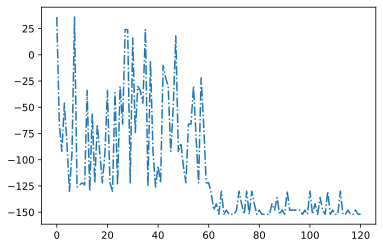

In [16]:
#Function to run the hopfield network with only one col activated at a time
arr = 2
numCycles = 2
threshold = 0
noise = 0
numCols = 60
hystereticThresh = 0

energyHistory = np.zeros(numCycles*numCols+1)
appliedVector1 = np.zeros((64,1))
appliedVector2 = np.zeros((64,1))

randomVector = np.random.randint(2, size=(60,1))
initVector = randomVector

appliedVector1[0:60,:] = randomVector[:,:]
appliedVector2[0:60,:] = 1-randomVector[:,:]
neuronVector = appliedVector1[0:60,:] - appliedVector2[0:60,:]

energyHistory[0]= 0.5*np.dot(neuronVector.T, (CMat @ neuronVector))
neuronVectorHistory = np.zeros((60,numCycles*numCols+1))
#neuronVectorHistory[:,0] = neuronVector
neuronVectorHistory[:,0] = appliedVector1[0:60,0] - appliedVector2[0:60,0]

for cc in np.arange(numCycles):
    randOrderColumns = np.arange(60)
    np.random.shuffle(randOrderColumns)
    threshVector = threshold - np.ones(60)*hystereticThresh*neuronVector
    for ii in randOrderColumns:
        output1  = dpe.multiply_w_delay(arr, appliedVector1, c_sel=[ii, ii+1], mode=1, debug=False, delay=5)
        output2  = dpe.multiply_w_delay(arr, appliedVector2, c_sel=[ii, ii+1], mode=1, debug=False, delay=5)
        #output = output1[0,ii] - output2[0,ii]
        output_corr = noise - dpe.lin_corr(output1, lin_corrs) + dpe.lin_corr(output2, lin_corrs)
        if (output_corr >= threshVector[ii,0]):
            appliedVector1[ii,0] = 1
            appliedVector2[ii,0] = 0
            neuronVector[ii] = 1
        else:
            appliedVector1[ii,0] = 0
            appliedVector2[ii,0] = 1
            neuronVector[ii] = -1
        energyHistory[60*cc+ii+1]= 0.5*np.dot(neuronVector.T, (CMat @ neuronVector))
        neuronVectorHistory[:,60*cc+ii+1] = neuronVector[:,0]

fig, ax = plt.subplots()
ax.plot(energyHistory,'-.')

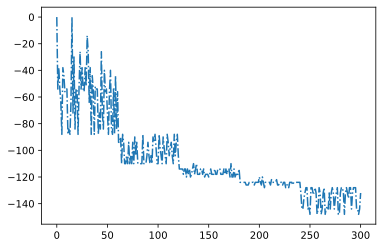

In [18]:
#Function to run the hopfield network with all cols activated in parallel
arr = 2
numCycles = 5
threshold = 0
noise = 0
numCols = 60
hystereticThresh = 0

energyHistory = np.zeros(numCycles*numCols+1)
appliedVector1 = np.zeros((64,1))
appliedVector2 = np.zeros((64,1))

randomVector = np.random.randint(2, size=(60,1))
initVector = randomVector

appliedVector1[0:60,:] = randomVector[:,:]
appliedVector2[0:60,:] = 1-randomVector[:,:]
neuronVector = appliedVector1[0:60,:] - appliedVector2[0:60,:]

energyHistory[0]= 0.5*np.dot(neuronVector.T, (CMat @ neuronVector))
neuronVectorHistory = np.zeros((60,numCycles*numCols+1))
#neuronVectorHistory[:,0] = neuronVector
neuronVectorHistory[:,0] = appliedVector1[0:60,0] - appliedVector2[0:60,0]

for cc in np.arange(numCycles):
    randOrderColumns = np.arange(60)
    np.random.shuffle(randOrderColumns)
    threshVector = threshold - np.ones(60)*hystereticThresh*neuronVector
    for ii in randOrderColumns:
        output1  = dpe.multiply_w_delay(arr, appliedVector1, c_sel=[0, 60], mode=1, debug=False, delay=5)
        output2  = dpe.multiply_w_delay(arr, appliedVector2, c_sel=[0, 60], mode=1, debug=False, delay=5)
        #output = output1[0,ii] - output2[0,ii]
        output_corr = noise - dpe.lin_corr(output1, lin_corrs_allcols) + dpe.lin_corr(output2, lin_corrs_allcols)
        if (output_corr[0,ii] >= threshVector[ii,0]):
            appliedVector1[ii,0] = 1
            appliedVector2[ii,0] = 0
            neuronVector[ii] = 1
        else:
            appliedVector1[ii,0] = 0
            appliedVector2[ii,0] = 1
            neuronVector[ii] = -1
        energyHistory[60*cc+ii+1]= 0.5*np.dot(neuronVector.T, (CMat @ neuronVector))
        neuronVectorHistory[:,60*cc+ii+1] = neuronVector[:,0]

fig, ax = plt.subplots()
ax.plot(energyHistory,'-.')

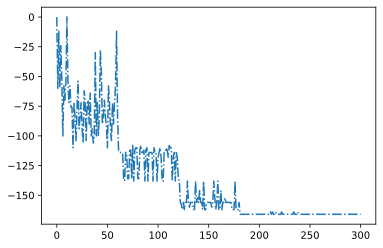

In [19]:
#Function to run the hopfield network with only one col activated at a time
arr = 2
numCycles = 5
threshold = 0
noise = 0
numCols = 60
hystereticThresh = 0

energyHistory = np.zeros(numCycles*numCols+1)
appliedVector1 = np.zeros((64,1))
appliedVector2 = np.zeros((64,1))

#randomVector = np.random.randint(2, size=(60,1))
initVector = randomVector

appliedVector1[0:60,:] = randomVector[:,:]
appliedVector2[0:60,:] = 1-randomVector[:,:]
neuronVector = appliedVector1[0:60,:] - appliedVector2[0:60,:]

energyHistory[0]= 0.5*np.dot(neuronVector.T, (CMat @ neuronVector))
neuronVectorHistory = np.zeros((60,numCycles*numCols+1))
#neuronVectorHistory[:,0] = neuronVector
neuronVectorHistory[:,0] = appliedVector1[0:60,0] - appliedVector2[0:60,0]

for cc in np.arange(numCycles):
    randOrderColumns = np.arange(60)
    np.random.shuffle(randOrderColumns)
    threshVector = threshold - np.ones(60)*hystereticThresh*neuronVector
    for ii in randOrderColumns:
        output1  = dpe.multiply_w_delay(arr, appliedVector1, c_sel=[ii, ii+1], mode=1, debug=False, delay=5)
        output2  = dpe.multiply_w_delay(arr, appliedVector2, c_sel=[ii, ii+1], mode=1, debug=False, delay=5)
        #output = output1[0,ii] - output2[0,ii]
        output_corr = noise - dpe.lin_corr(output1, lin_corrs) + dpe.lin_corr(output2, lin_corrs)
        if (output_corr >= threshVector[ii,0]):
            appliedVector1[ii,0] = 1
            appliedVector2[ii,0] = 0
            neuronVector[ii] = 1
        else:
            appliedVector1[ii,0] = 0
            appliedVector2[ii,0] = 1
            neuronVector[ii] = -1
        energyHistory[60*cc+ii+1]= 0.5*np.dot(neuronVector.T, (CMat @ neuronVector))
        neuronVectorHistory[:,60*cc+ii+1] = neuronVector[:,0]

fig, ax = plt.subplots()
ax.plot(energyHistory,'-.')

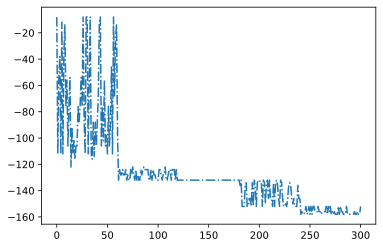

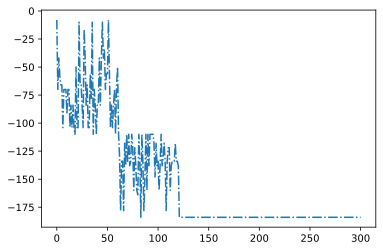

In [20]:
#Function to run the hopfield network with all cols activated in parallel
arr = 2
numCycles = 5
threshold = 0
noise = 0
numCols = 60
hystereticThresh = 0

energyHistory = np.zeros(numCycles*numCols+1)
appliedVector1 = np.zeros((64,1))
appliedVector2 = np.zeros((64,1))

randomVector = np.random.randint(2, size=(60,1))
initVector = randomVector

appliedVector1[0:60,:] = randomVector[:,:]
appliedVector2[0:60,:] = 1-randomVector[:,:]
neuronVector = appliedVector1[0:60,:] - appliedVector2[0:60,:]

energyHistory[0]= 0.5*np.dot(neuronVector.T, (CMat @ neuronVector))
neuronVectorHistory = np.zeros((60,numCycles*numCols+1))
#neuronVectorHistory[:,0] = neuronVector
neuronVectorHistory[:,0] = appliedVector1[0:60,0] - appliedVector2[0:60,0]

for cc in np.arange(numCycles):
    randOrderColumns = np.arange(60)
    np.random.shuffle(randOrderColumns)
    threshVector = threshold - np.ones(60)*hystereticThresh*neuronVector
    for ii in randOrderColumns:
        output1  = dpe.multiply_w_delay(arr, appliedVector1, c_sel=[0, 60], mode=1, debug=False, delay=5)
        output2  = dpe.multiply_w_delay(arr, appliedVector2, c_sel=[0, 60], mode=1, debug=False, delay=5)
        #output = output1[0,ii] - output2[0,ii]
        output_corr = noise - dpe.lin_corr(output1, lin_corrs_allcols) + dpe.lin_corr(output2, lin_corrs_allcols)
        if (output_corr[0,ii] >= threshVector[ii,0]):
            appliedVector1[ii,0] = 1
            appliedVector2[ii,0] = 0
            neuronVector[ii] = 1
        else:
            appliedVector1[ii,0] = 0
            appliedVector2[ii,0] = 1
            neuronVector[ii] = -1
        energyHistory[60*cc+ii+1]= 0.5*np.dot(neuronVector.T, (CMat @ neuronVector))
        neuronVectorHistory[:,60*cc+ii+1] = neuronVector[:,0]

fig, ax = plt.subplots()
ax.plot(energyHistory,'-.')

#Function to run the hopfield network with only one col activated at a time
arr = 2
numCycles = 5
threshold = 0
noise = 0
numCols = 60
hystereticThresh = 0

energyHistory = np.zeros(numCycles*numCols+1)
SWenergyHistory = np.zeros(numCycles*numCols+1)
appliedVector1 = np.zeros((64,1))
appliedVector2 = np.zeros((64,1))

#randomVector = np.random.randint(2, size=(60,1))
initVector = randomVector

appliedVector1[0:60,:] = randomVector[:,:]
appliedVector2[0:60,:] = 1-randomVector[:,:]
neuronVector = appliedVector1[0:60,:] - appliedVector2[0:60,:]
SWneuronVector = appliedVector1[0:60,:] - appliedVector2[0:60,:]

energyHistory[0]= 0.5*np.dot(neuronVector.T, (CMat @ neuronVector))
neuronVectorHistory = np.zeros((60,numCycles*numCols+1))
SWneuronVectorHistory = np.zeros((60,numCycles*numCols+1))
#neuronVectorHistory[:,0] = neuronVector
neuronVectorHistory[:,0] = appliedVector1[0:60,0] - appliedVector2[0:60,0]
SWneuronVectorHistory[:,0] = appliedVector1[0:60,0] - appliedVector2[0:60,0]


for cc in np.arange(numCycles):
    randOrderColumns = np.arange(60)
    np.random.shuffle(randOrderColumns)
    threshVector = threshold - np.ones(60)*hystereticThresh*neuronVector
    for ii in randOrderColumns:
        output1  = dpe.multiply_w_delay(arr, appliedVector1, c_sel=[ii, ii+1], mode=1, debug=False, delay=5)
        output2  = dpe.multiply_w_delay(arr, appliedVector2, c_sel=[ii, ii+1], mode=1, debug=False, delay=5)
        #output = output1[0,ii] - output2[0,ii]
        output_corr = noise - dpe.lin_corr(output1, lin_corrs) + dpe.lin_corr(output2, lin_corrs)
        if (output_corr >= threshVector[ii,0]):
            appliedVector1[ii,0] = 1
            appliedVector2[ii,0] = 0
            neuronVector[ii] = 1
        else:
            appliedVector1[ii,0] = 0
            appliedVector2[ii,0] = 1
            neuronVector[ii] = -1
        energyHistory[60*cc+ii+1]= 0.5*np.dot(neuronVector.T, (CMat @ neuronVector))
        neuronVectorHistory[:,60*cc+ii+1] = neuronVector[:,0]
        
        SWoutput = (SWneuronVector.T @ CMat)[0]
        if (SWoutput[ii] >= threshVector[ii,0]):
            SWneuronVector[ii] = 1
        else:
            SWneuronVector[ii] = -1
        SWenergyHistory[60*cc+ii+1]= 0.5*np.dot(SWneuronVector.T, (CMat @ SWneuronVector))
        SWneuronVectorHistory[:,60*cc+ii+1] = SWneuronVector[:,0]
        
fig, ax = plt.subplots()
ax.plot(energyHistory,'-.')

fig, ax = plt.subplots()
ax.plot(SWenergyHistory,'-.')

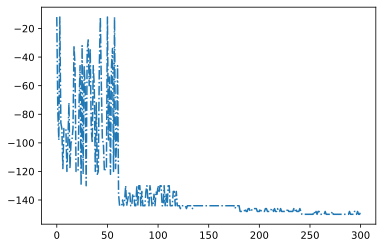

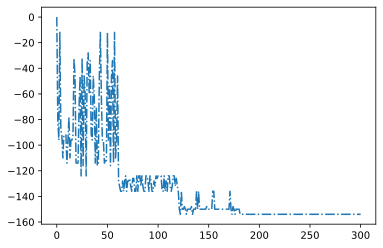

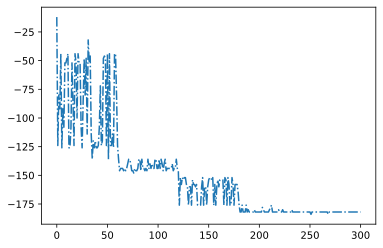

In [32]:
#Function to run the hopfield network with only one col activated at a time
arr = 2
numCycles = 5
threshold = 0
noise = 0
numCols = 60
hystereticThresh = 0

energyHistory = np.zeros(numCycles*numCols+1)
SWenergyHistory = np.zeros(numCycles*numCols+1)
appliedVector1 = np.zeros((64,1))
appliedVector2 = np.zeros((64,1))

randomVector = np.random.randint(2, size=(60,1))
initVector = randomVector

appliedVector1[0:60,:] = randomVector[:,:]
appliedVector2[0:60,:] = 1-randomVector[:,:]
neuronVector = appliedVector1[0:60,:] - appliedVector2[0:60,:]
SWneuronVector = appliedVector1[0:60,:] - appliedVector2[0:60,:]

energyHistory[0]= 0.5*np.dot(neuronVector.T, (CMat @ neuronVector))
neuronVectorHistory = np.zeros((60,numCycles*numCols+1))
SWneuronVectorHistory = np.zeros((60,numCycles*numCols+1))
#neuronVectorHistory[:,0] = neuronVector
neuronVectorHistory[:,0] = appliedVector1[0:60,0] - appliedVector2[0:60,0]
SWneuronVectorHistory[:,0] = appliedVector1[0:60,0] - appliedVector2[0:60,0]


for cc in np.arange(numCycles):
    randOrderColumns = np.arange(60)
    np.random.shuffle(randOrderColumns)
    threshVector = threshold - np.ones(60)*hystereticThresh*neuronVector
    for ii in randOrderColumns:
        output1  = dpe.multiply_w_delay(arr, appliedVector1, c_sel=[ii, ii+1], mode=1, debug=False, delay=5)
        output2  = dpe.multiply_w_delay(arr, appliedVector2, c_sel=[ii, ii+1], mode=1, debug=False, delay=5)
        #output = output1[0,ii] - output2[0,ii]
        output_corr = noise - dpe.lin_corr(output1, lin_corrs) + dpe.lin_corr(output2, lin_corrs)
        if (output_corr >= threshVector[ii,0]):
            appliedVector1[ii,0] = 1
            appliedVector2[ii,0] = 0
            neuronVector[ii] = 1
        else:
            appliedVector1[ii,0] = 0
            appliedVector2[ii,0] = 1
            neuronVector[ii] = -1
        energyHistory[60*cc+ii+1]= 0.5*np.dot(neuronVector.T, (CMat @ neuronVector))
        neuronVectorHistory[:,60*cc+ii+1] = neuronVector[:,0]
        
        SWoutput = -1*(SWneuronVector.T @ CMat)[0]
        if (SWoutput[ii] >= threshVector[ii,0]):
            SWneuronVector[ii] = 1
        else:
            SWneuronVector[ii] = -1
        SWenergyHistory[60*cc+ii+1]= 0.5*np.dot(SWneuronVector.T, (CMat @ SWneuronVector))
        SWneuronVectorHistory[:,60*cc+ii+1] = SWneuronVector[:,0]
        
fig, ax = plt.subplots()
ax.plot(energyHistory,'-.')

fig, ax = plt.subplots()
ax.plot(SWenergyHistory,'-.')

#Function to run the hopfield network with all cols activated in parallel
arr = 2
numCycles = 5
threshold = 0
noise = 0
numCols = 60
hystereticThresh = 0

energyHistory = np.zeros(numCycles*numCols+1)
appliedVector1 = np.zeros((64,1))
appliedVector2 = np.zeros((64,1))

#randomVector = np.random.randint(2, size=(60,1))
initVector = randomVector

appliedVector1[0:60,:] = randomVector[:,:]
appliedVector2[0:60,:] = 1-randomVector[:,:]
neuronVector = appliedVector1[0:60,:] - appliedVector2[0:60,:]

energyHistory[0]= 0.5*np.dot(neuronVector.T, (CMat @ neuronVector))
neuronVectorHistory = np.zeros((60,numCycles*numCols+1))
#neuronVectorHistory[:,0] = neuronVector
neuronVectorHistory[:,0] = appliedVector1[0:60,0] - appliedVector2[0:60,0]

for cc in np.arange(numCycles):
    randOrderColumns = np.arange(60)
    np.random.shuffle(randOrderColumns)
    threshVector = threshold - np.ones(60)*hystereticThresh*neuronVector
    for ii in randOrderColumns:
        output1  = dpe.multiply_w_delay(arr, appliedVector1, c_sel=[0, 60], mode=1, debug=False, delay=5)
        output2  = dpe.multiply_w_delay(arr, appliedVector2, c_sel=[0, 60], mode=1, debug=False, delay=5)
        #output = output1[0,ii] - output2[0,ii]
        output_corr = noise - dpe.lin_corr(output1, lin_corrs_allcols) + dpe.lin_corr(output2, lin_corrs_allcols)
        if (output_corr[0,ii] >= threshVector[ii,0]):
            appliedVector1[ii,0] = 1
            appliedVector2[ii,0] = 0
            neuronVector[ii] = 1
        else:
            appliedVector1[ii,0] = 0
            appliedVector2[ii,0] = 1
            neuronVector[ii] = -1
        energyHistory[60*cc+ii+1]= 0.5*np.dot(neuronVector.T, (CMat @ neuronVector))
        neuronVectorHistory[:,60*cc+ii+1] = neuronVector[:,0]

fig, ax = plt.subplots()
ax.plot(energyHistory,'-.')

Saving In(<class 'list'>), Out(<class 'dict'>), PIC_PINS(<class 'dict'>), DAC_CH(<class 'dict'>), DAC_SPAN(<class 'dict'>), REFCLKO(<class 'dict'>), mat_contents(<class 'dict'>), CMat(<class 'numpy.ndarray'>), arr(<class 'int'>), numTests(<class 'int'>), appliedVector1(<class 'numpy.ndarray'>), appliedVector2(<class 'numpy.ndarray'>), randomVector(<class 'numpy.ndarray'>), neuronVector(<class 'numpy.ndarray'>), output1(<class 'numpy.ndarray'>), output2(<class 'numpy.ndarray'>), all_output(<class 'numpy.ndarray'>), SW_output1(<class 'numpy.ndarray'>), SW_output2(<class 'numpy.ndarray'>), all_SW_output(<class 'numpy.ndarray'>), lin_corrs(<class 'list'>), c(<class 'int'>), output_corr(<class 'numpy.ndarray'>), output_corr1(<class 'numpy.ndarray'>), output_corr2(<class 'numpy.ndarray'>), exp_neuron_output(<class 'numpy.ndarray'>), SW_neuron_output(<class 'numpy.ndarray'>), error(<class 'numpy.ndarray'>), x(<class 'numpy.ndarray'>), y(<class 'numpy.ndarray'>), zz(<class 'numpy.ndarray'>), e

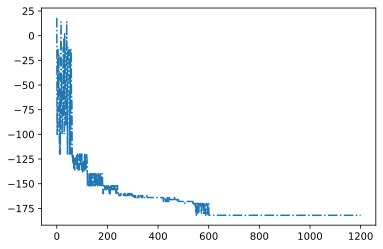

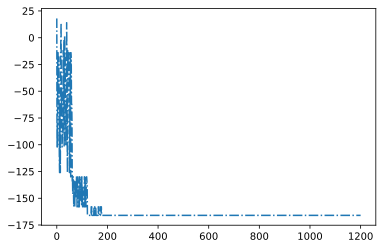

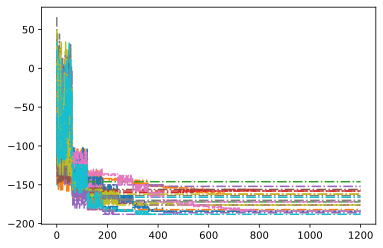

In [34]:
#Function to run the hopfield network with only one col activated at a time
arr = 2
numCycles = 20
numTrials = 20
threshold = 0
noise = 0
numCols = 60
hystereticThresh = 0

energyHistory = np.zeros((numCycles*numCols+1, numTrials))
energyHistory2 = np.zeros((numCycles*numCols+1, numTrials))
SWenergyHistory = np.zeros((numCycles*numCols+1, numTrials))
appliedVector1 = np.zeros((64,1))
appliedVector2 = np.zeros((64,1))
appliedVector12 = np.zeros((64,1))
appliedVector22 = np.zeros((64,1))

neuronVectorHistory = np.zeros((60,numCycles*numCols+1, numTrials))
neuronVectorHistory2 = np.zeros((60,numCycles*numCols+1, numTrials))
SWneuronVectorHistory = np.zeros((60,numCycles*numCols+1, numTrials))

for tt in np.arange(numTrials):
    randomVector = np.random.randint(2, size=(60,1))
    initVector = randomVector

    appliedVector1[0:60,:] = initVector[:,:]
    appliedVector2[0:60,:] = 1-initVector[:,:]
    neuronVector = appliedVector1[0:60,:] - appliedVector2[0:60,:]
    SWneuronVector = appliedVector1[0:60,:] - appliedVector2[0:60,:]
    appliedVector12[0:60,:] = initVector[:,:]
    appliedVector22[0:60,:] = 1-initVector[:,:]
    neuronVector2 = appliedVector12[0:60,:] - appliedVector22[0:60,:]
    
    neuronVectorHistory[:,0,tt] = appliedVector1[0:60,0] - appliedVector2[0:60,0]
    neuronVectorHistory2[:,0,tt] = appliedVector12[0:60,0] - appliedVector22[0:60,0]
    SWneuronVectorHistory[:,0,tt] = appliedVector1[0:60,0] - appliedVector2[0:60,0]
    
    energyHistory[0,tt]= 0.5*np.dot(neuronVector.T, (CMat @ neuronVector))
    energyHistory2[0,tt]= 0.5*np.dot(neuronVector2.T, (CMat @ neuronVector2))
    SWenergyHistory[0,tt]= 0.5*np.dot(SWneuronVector.T, (CMat @ SWneuronVector))

    for cc in np.arange(numCycles):
        randOrderColumns = np.arange(60)
        np.random.shuffle(randOrderColumns)
        threshVector = threshold - np.ones(60)*hystereticThresh*neuronVector
        for ii in randOrderColumns:
            output1  = dpe.multiply_w_delay(arr, appliedVector1, c_sel=[ii, ii+1], mode=1, debug=False, delay=5)
            output2  = dpe.multiply_w_delay(arr, appliedVector2, c_sel=[ii, ii+1], mode=1, debug=False, delay=5)
            
            output_corr = noise - dpe.lin_corr(output1, lin_corrs) + dpe.lin_corr(output2, lin_corrs)
            if (output_corr >= threshVector[ii,0]):
                appliedVector1[ii,0] = 1
                appliedVector2[ii,0] = 0
                neuronVector[ii] = 1
            else:
                appliedVector1[ii,0] = 0
                appliedVector2[ii,0] = 1
                neuronVector[ii] = -1
            energyHistory[60*cc+ii+1,tt]= 0.5*np.dot(neuronVector.T, (CMat @ neuronVector))
            neuronVectorHistory[:,60*cc+ii+1,tt] = neuronVector[:,0]

            SWoutput = -1*(SWneuronVector.T @ CMat)[0]
            if (SWoutput[ii] >= threshVector[ii,0]):
                SWneuronVector[ii] = 1
            else:
                SWneuronVector[ii] = -1
            SWenergyHistory[60*cc+ii+1,tt]= 0.5*np.dot(SWneuronVector.T, (CMat @ SWneuronVector))
            SWneuronVectorHistory[:,60*cc+ii+1,tt] = SWneuronVector[:,0]
        
            output12  = dpe.multiply_w_delay(arr, appliedVector12, c_sel=[0, 60], mode=1, debug=False, delay=5)
            output22  = dpe.multiply_w_delay(arr, appliedVector22, c_sel=[0, 60], mode=1, debug=False, delay=5)
            
            output_corr2 = noise - dpe.lin_corr(output12, lin_corrs_allcols) + dpe.lin_corr(output22, lin_corrs_allcols)
            if (output_corr2[0,ii] >= threshVector[ii,0]):
                appliedVector12[ii,0] = 1
                appliedVector22[ii,0] = 0
                neuronVector2[ii] = 1
            else:
                appliedVector12[ii,0] = 0
                appliedVector22[ii,0] = 1
                neuronVector2[ii] = -1
            energyHistory2[60*cc+ii+1,tt]= 0.5*np.dot(neuronVector2.T, (CMat @ neuronVector2))
            neuronVectorHistory2[:,60*cc+ii+1,tt] = neuronVector2[:,0]
        
        
fig, ax = plt.subplots()
ax.plot(energyHistory[:,0],'-.')

fig, ax = plt.subplots()
ax.plot(SWenergyHistory[:,0],'-.')

fig, ax = plt.subplots()
ax.plot(energyHistory2,'-.')

save_workspace(vars(), note='Prober2_HNN_20cyc_20trials_0Schmidt')

In [41]:
print(np.amin(SWenergyHistory[-1,:]))
print(np.amin(energyHistory[-1,:]))
print(np.amin(energyHistory2[-1,:]))

-188.0
-188.0
-188.0


In [42]:
#Function to run the hopfield network with only one col activated at a time
arr = 2
numCycles = 10
numTrials = 10
threshold = 0
noise = 0
numCols = 60

numStartSchmidt = 5
numEndSchmidt = 4
startSchmidtVals = np.linspace(-8,-4,numStartSchmidt)
endSchmidtVals = np.linspace(0,1.75,numEndSchmidt)


energyHistory = np.zeros((numCycles*numCols+1, numTrials, numStartSchmidt, numEndSchmidt))
energyHistory2 = np.zeros((numCycles*numCols+1, numTrials, numStartSchmidt, numEndSchmidt))
SWenergyHistory = np.zeros((numCycles*numCols+1, numTrials, numStartSchmidt, numEndSchmidt))
appliedVector1 = np.zeros((64,1))
appliedVector2 = np.zeros((64,1))
appliedVector12 = np.zeros((64,1))
appliedVector22 = np.zeros((64,1))

neuronVectorHistory = np.zeros((60,numCycles*numCols+1, numTrials, numStartSchmidt, numEndSchmidt))
neuronVectorHistory2 = np.zeros((60,numCycles*numCols+1, numTrials, numStartSchmidt, numEndSchmidt))
SWneuronVectorHistory = np.zeros((60,numCycles*numCols+1, numTrials, numStartSchmidt, numEndSchmidt))

for tt in np.arange(numTrials):
    print('Trial number', tt)
    randomVector = np.random.randint(2, size=(60,1))
    initVector = randomVector

    for ss in np.arange(numStartSchmidt):
        for se in np.arange(numEndSchmidt):
            SchmidtCycleVector = np.linspace(startSchmidtVals[ss], endSchmidtVals[se], numCycles)

            appliedVector1[0:60,:] = initVector[:,:]
            appliedVector2[0:60,:] = 1-initVector[:,:]
            neuronVector = appliedVector1[0:60,:] - appliedVector2[0:60,:]
            SWneuronVector = appliedVector1[0:60,:] - appliedVector2[0:60,:]
            appliedVector12[0:60,:] = initVector[:,:]
            appliedVector22[0:60,:] = 1-initVector[:,:]
            neuronVector2 = appliedVector12[0:60,:] - appliedVector22[0:60,:]

            neuronVectorHistory[:,0,tt,ss,se] = appliedVector1[0:60,0] - appliedVector2[0:60,0]
            neuronVectorHistory2[:,0,tt,ss,se] = appliedVector12[0:60,0] - appliedVector22[0:60,0]
            SWneuronVectorHistory[:,0,tt,ss,se] = appliedVector1[0:60,0] - appliedVector2[0:60,0]

            energyHistory[0,tt,ss,se]= 0.5*np.dot(neuronVector.T, (CMat @ neuronVector))
            energyHistory2[0,tt,ss,se]= 0.5*np.dot(neuronVector2.T, (CMat @ neuronVector2))
            SWenergyHistory[0,tt,ss,se]= 0.5*np.dot(SWneuronVector.T, (CMat @ SWneuronVector))

            for cc in np.arange(numCycles):
                randOrderColumns = np.arange(60)
                np.random.shuffle(randOrderColumns)
                #threshVector = threshold - np.ones(60)*hystereticThresh*neuronVector
                threshVector = threshold - np.ones(numCols)*SchmidtCycleVector[cc]*neuronVector
                threshVectorSW = threshold - np.ones(numCols)*SchmidtCycleVector[cc]*SWneuronVector
                threshVector2 = threshold - np.ones(numCols)*SchmidtCycleVector[cc]*neuronVector2
                
                for ii in randOrderColumns:
                    output1  = dpe.multiply_w_delay(arr, appliedVector1, c_sel=[ii, ii+1], mode=1, debug=False, delay=5)
                    output2  = dpe.multiply_w_delay(arr, appliedVector2, c_sel=[ii, ii+1], mode=1, debug=False, delay=5)

                    output_corr = noise - dpe.lin_corr(output1, lin_corrs) + dpe.lin_corr(output2, lin_corrs)
                    if (output_corr >= threshVector[ii,0]):
                        appliedVector1[ii,0] = 1
                        appliedVector2[ii,0] = 0
                        neuronVector[ii] = 1
                    else:
                        appliedVector1[ii,0] = 0
                        appliedVector2[ii,0] = 1
                        neuronVector[ii] = -1
                    energyHistory[60*cc+ii+1,tt,ss,se]= 0.5*np.dot(neuronVector.T, (CMat @ neuronVector))
                    neuronVectorHistory[:,60*cc+ii+1,tt,ss,se] = neuronVector[:,0]

                    SWoutput = -1*(SWneuronVector.T @ CMat)[0]
                    if (SWoutput[ii] >= threshVectorSW[ii,0]):
                        SWneuronVector[ii] = 1
                    else:
                        SWneuronVector[ii] = -1
                    SWenergyHistory[60*cc+ii+1,tt,ss,se]= 0.5*np.dot(SWneuronVector.T, (CMat @ SWneuronVector))
                    SWneuronVectorHistory[:,60*cc+ii+1,tt,ss,se] = SWneuronVector[:,0]

                    output12  = dpe.multiply_w_delay(arr, appliedVector12, c_sel=[0, 60], mode=1, debug=False, delay=5)
                    output22  = dpe.multiply_w_delay(arr, appliedVector22, c_sel=[0, 60], mode=1, debug=False, delay=5)

                    output_corr2 = noise - dpe.lin_corr(output12, lin_corrs_allcols) + dpe.lin_corr(output22, lin_corrs_allcols)
                    if (output_corr2[0,ii] >= threshVector2[ii,0]):
                        appliedVector12[ii,0] = 1
                        appliedVector22[ii,0] = 0
                        neuronVector2[ii] = 1
                    else:
                        appliedVector12[ii,0] = 0
                        appliedVector22[ii,0] = 1
                        neuronVector2[ii] = -1
                    energyHistory2[60*cc+ii+1,tt,ss,se]= 0.5*np.dot(neuronVector2.T, (CMat @ neuronVector2))
                    neuronVectorHistory2[:,60*cc+ii+1,tt,ss,se] = neuronVector2[:,0]
        
        
#fig, ax = plt.subplots()
#ax.plot(energyHistory[:,0],'-.')

#fig, ax = plt.subplots()
#ax.plot(SWenergyHistory[:,0],'-.')

#fig, ax = plt.subplots()
#ax.plot(energyHistory2,'-.')

save_workspace(vars(), note='Prober2_HNN_10cyc_10trials_20Schmidt')

Trial number 0
Trial number 1
Trial number 2
Trial number 3
Trial number 4
Trial number 5
Trial number 6
Trial number 7
Trial number 8
Trial number 9
Saving In(<class 'list'>), Out(<class 'dict'>), PIC_PINS(<class 'dict'>), DAC_CH(<class 'dict'>), DAC_SPAN(<class 'dict'>), REFCLKO(<class 'dict'>), mat_contents(<class 'dict'>), CMat(<class 'numpy.ndarray'>), arr(<class 'int'>), numTests(<class 'int'>), appliedVector1(<class 'numpy.ndarray'>), appliedVector2(<class 'numpy.ndarray'>), randomVector(<class 'numpy.ndarray'>), neuronVector(<class 'numpy.ndarray'>), output1(<class 'numpy.ndarray'>), output2(<class 'numpy.ndarray'>), all_output(<class 'numpy.ndarray'>), SW_output1(<class 'numpy.ndarray'>), SW_output2(<class 'numpy.ndarray'>), all_SW_output(<class 'numpy.ndarray'>), lin_corrs(<class 'list'>), c(<class 'int'>), output_corr(<class 'numpy.ndarray'>), output_corr1(<class 'numpy.ndarray'>), output_corr2(<class 'numpy.ndarray'>), exp_neuron_output(<class 'numpy.ndarray'>), SW_neuron_o

In [43]:
#Function to run the hopfield network with only one col activated at a time
arr = 2
numCycles = 10
numTrials = 20
threshold = 0
noise = 0
numCols = 60

numStartSchmidt = 5
numEndSchmidt = 5
startSchmidtVals = np.linspace(-5.5,-3.5,numStartSchmidt)
endSchmidtVals = np.linspace(0.6,2.2,numEndSchmidt)

energyHistory = np.zeros((numCycles*numCols+1, numTrials, numStartSchmidt, numEndSchmidt))
SWenergyHistory = np.zeros((numCycles*numCols+1, numTrials, numStartSchmidt, numEndSchmidt))
appliedVector1 = np.zeros((64,1))
appliedVector2 = np.zeros((64,1))

neuronVectorHistory = np.zeros((60,numCycles*numCols+1, numTrials, numStartSchmidt, numEndSchmidt))
SWneuronVectorHistory = np.zeros((60,numCycles*numCols+1, numTrials, numStartSchmidt, numEndSchmidt))

for tt in np.arange(numTrials):
    print('Trial number', tt)
    randomVector = np.random.randint(2, size=(60,1))
    initVector = randomVector

    for ss in np.arange(numStartSchmidt):
        for se in np.arange(numEndSchmidt):
            SchmidtCycleVector = np.linspace(startSchmidtVals[ss], endSchmidtVals[se], numCycles)

            appliedVector1[0:60,:] = initVector[:,:]
            appliedVector2[0:60,:] = 1-initVector[:,:]
            neuronVector = appliedVector1[0:60,:] - appliedVector2[0:60,:]
            SWneuronVector = appliedVector1[0:60,:] - appliedVector2[0:60,:]
            
            neuronVectorHistory[:,0,tt,ss,se] = appliedVector1[0:60,0] - appliedVector2[0:60,0]            
            SWneuronVectorHistory[:,0,tt,ss,se] = appliedVector1[0:60,0] - appliedVector2[0:60,0]

            energyHistory[0,tt,ss,se]= 0.5*np.dot(neuronVector.T, (CMat @ neuronVector))            
            SWenergyHistory[0,tt,ss,se]= 0.5*np.dot(SWneuronVector.T, (CMat @ SWneuronVector))

            for cc in np.arange(numCycles):
                randOrderColumns = np.arange(60)
                np.random.shuffle(randOrderColumns)
                #threshVector = threshold - np.ones(60)*hystereticThresh*neuronVector
                threshVector = threshold - np.ones(numCols)*SchmidtCycleVector[cc]*neuronVector
                threshVectorSW = threshold - np.ones(numCols)*SchmidtCycleVector[cc]*SWneuronVector
                
                for ii in randOrderColumns:
                    output1  = dpe.multiply_w_delay(arr, appliedVector1, c_sel=[ii, ii+1], mode=1, debug=False, delay=5)
                    output2  = dpe.multiply_w_delay(arr, appliedVector2, c_sel=[ii, ii+1], mode=1, debug=False, delay=5)

                    output_corr = noise - dpe.lin_corr(output1, lin_corrs) + dpe.lin_corr(output2, lin_corrs)
                    if (output_corr >= threshVector[ii,0]):
                        appliedVector1[ii,0] = 1
                        appliedVector2[ii,0] = 0
                        neuronVector[ii] = 1
                    else:
                        appliedVector1[ii,0] = 0
                        appliedVector2[ii,0] = 1
                        neuronVector[ii] = -1
                    energyHistory[60*cc+ii+1,tt,ss,se]= 0.5*np.dot(neuronVector.T, (CMat @ neuronVector))
                    neuronVectorHistory[:,60*cc+ii+1,tt,ss,se] = neuronVector[:,0]

                    SWoutput = -1*(SWneuronVector.T @ CMat)[0]
                    if (SWoutput[ii] >= threshVectorSW[ii,0]):
                        SWneuronVector[ii] = 1
                    else:
                        SWneuronVector[ii] = -1
                    SWenergyHistory[60*cc+ii+1,tt,ss,se]= 0.5*np.dot(SWneuronVector.T, (CMat @ SWneuronVector))
                    SWneuronVectorHistory[:,60*cc+ii+1,tt,ss,se] = SWneuronVector[:,0]
        
#fig, ax = plt.subplots()
#ax.plot(energyHistory[:,0],'-.')

#fig, ax = plt.subplots()
#ax.plot(SWenergyHistory[:,0],'-.')

#fig, ax = plt.subplots()
#ax.plot(energyHistory2,'-.')

save_workspace(vars(), note='Prober2_HNN_10cyc_20trials_25Schmidt')

Trial number 0
Trial number 1
Trial number 2
Trial number 3
Trial number 4
Trial number 5
Trial number 6
Trial number 7
Trial number 8
Trial number 9
Trial number 10
Trial number 11
Trial number 12
Trial number 13
Trial number 14
Trial number 15
Trial number 16
Trial number 17
Trial number 18
Trial number 19
Saving In(<class 'list'>), Out(<class 'dict'>), PIC_PINS(<class 'dict'>), DAC_CH(<class 'dict'>), DAC_SPAN(<class 'dict'>), REFCLKO(<class 'dict'>), mat_contents(<class 'dict'>), CMat(<class 'numpy.ndarray'>), arr(<class 'int'>), numTests(<class 'int'>), appliedVector1(<class 'numpy.ndarray'>), appliedVector2(<class 'numpy.ndarray'>), randomVector(<class 'numpy.ndarray'>), neuronVector(<class 'numpy.ndarray'>), output1(<class 'numpy.ndarray'>), output2(<class 'numpy.ndarray'>), all_output(<class 'numpy.ndarray'>), SW_output1(<class 'numpy.ndarray'>), SW_output2(<class 'numpy.ndarray'>), all_SW_output(<class 'numpy.ndarray'>), lin_corrs(<class 'list'>), c(<class 'int'>), output_corr

In [44]:
#Function to run the hopfield network with only one col activated at a time
arr = 2
numCycles = 50
numTrials = 100

startSchmidtVal = -4.5
endSchmidtVal = 1.4

threshold = 0
noise = 0
numCols = 60

energyHistory = np.zeros((numCycles*numCols+1, numTrials))
appliedVector1 = np.zeros((64,1))
appliedVector2 = np.zeros((64,1))

neuronVectorHistory = np.zeros((60,numCycles*numCols+1, numTrials))

for tt in np.arange(numTrials):
    print('Trial number', tt)
    randomVector = np.random.randint(2, size=(60,1))
    initVector = randomVector

    SchmidtCycleVector = np.linspace(startSchmidtVal, endSchmidtVal, numCycles)

    appliedVector1[0:60,:] = initVector[:,:]
    appliedVector2[0:60,:] = 1-initVector[:,:]
    neuronVector = appliedVector1[0:60,:] - appliedVector2[0:60,:]

    neuronVectorHistory[:,0,tt] = appliedVector1[0:60,0] - appliedVector2[0:60,0]
    energyHistory[0,tt]= 0.5*np.dot(neuronVector.T, (CMat @ neuronVector))            

    for cc in np.arange(numCycles):
        randOrderColumns = np.arange(60)
        np.random.shuffle(randOrderColumns)
        threshVector = threshold - np.ones(numCols)*SchmidtCycleVector[cc]*neuronVector

        for ii in randOrderColumns:
            output1  = dpe.multiply_w_delay(arr, appliedVector1, c_sel=[ii, ii+1], mode=1, debug=False, delay=5)
            output2  = dpe.multiply_w_delay(arr, appliedVector2, c_sel=[ii, ii+1], mode=1, debug=False, delay=5)
            output_corr = noise - dpe.lin_corr(output1, lin_corrs) + dpe.lin_corr(output2, lin_corrs)
            if (output_corr >= threshVector[ii,0]):
                appliedVector1[ii,0] = 1
                appliedVector2[ii,0] = 0
                neuronVector[ii] = 1
            else:
                appliedVector1[ii,0] = 0
                appliedVector2[ii,0] = 1
                neuronVector[ii] = -1
            energyHistory[60*cc+ii+1,tt]= 0.5*np.dot(neuronVector.T, (CMat @ neuronVector))
            neuronVectorHistory[:,60*cc+ii+1,tt] = neuronVector[:,0]

save_workspace(vars(), note='Prober2_HNN_50cyc_100trials_1Schmidt')

Trial number 0
Trial number 1
Trial number 2
Trial number 3
Trial number 4
Trial number 5
Trial number 6
Trial number 7
Trial number 8
Trial number 9
Trial number 10
Trial number 11
Trial number 12
Trial number 13
Trial number 14
Trial number 15
Trial number 16
Trial number 17
Trial number 18
Trial number 19
Trial number 20
Trial number 21
Trial number 22
Trial number 23
Trial number 24
Trial number 25
Trial number 26
Trial number 27
Trial number 28
Trial number 29
Trial number 30
Trial number 31
Trial number 32
Trial number 33
Trial number 34
Trial number 35
Trial number 36
Trial number 37
Trial number 38
Trial number 39
Trial number 40
Trial number 41
Trial number 42
Trial number 43
Trial number 44
Trial number 45
Trial number 46
Trial number 47
Trial number 48
Trial number 49
Trial number 50
Trial number 51
Trial number 52
Trial number 53
Trial number 54
Trial number 55
Trial number 56
Trial number 57
Trial number 58
Trial number 59
Trial number 60
Trial number 61
Trial number 62
Tr

In [45]:
#Function to run the hopfield network with only one col activated at a time
arr = 2
numCycles = 5
numTrials = 100

startSchmidtVal = -4.5
endSchmidtVal = 1.4

threshold = 0
noise = 0
numCols = 60

energyHistory = np.zeros((numCycles*numCols+1, numTrials))
appliedVector1 = np.zeros((64,1))
appliedVector2 = np.zeros((64,1))

neuronVectorHistory = np.zeros((60,numCycles*numCols+1, numTrials))

for tt in np.arange(numTrials):
    print('Trial number', tt)
    randomVector = np.random.randint(2, size=(60,1))
    initVector = randomVector

    SchmidtCycleVector = np.linspace(startSchmidtVal, endSchmidtVal, numCycles)

    appliedVector1[0:60,:] = initVector[:,:]
    appliedVector2[0:60,:] = 1-initVector[:,:]
    neuronVector = appliedVector1[0:60,:] - appliedVector2[0:60,:]

    neuronVectorHistory[:,0,tt] = appliedVector1[0:60,0] - appliedVector2[0:60,0]
    energyHistory[0,tt]= 0.5*np.dot(neuronVector.T, (CMat @ neuronVector))            

    for cc in np.arange(numCycles):
        randOrderColumns = np.arange(60)
        np.random.shuffle(randOrderColumns)
        threshVector = threshold - np.ones(numCols)*SchmidtCycleVector[cc]*neuronVector

        for ii in randOrderColumns:
            output1  = dpe.multiply_w_delay(arr, appliedVector1, c_sel=[ii, ii+1], mode=1, debug=False, delay=5)
            output2  = dpe.multiply_w_delay(arr, appliedVector2, c_sel=[ii, ii+1], mode=1, debug=False, delay=5)
            output_corr = noise - dpe.lin_corr(output1, lin_corrs) + dpe.lin_corr(output2, lin_corrs)
            if (output_corr >= threshVector[ii,0]):
                appliedVector1[ii,0] = 1
                appliedVector2[ii,0] = 0
                neuronVector[ii] = 1
            else:
                appliedVector1[ii,0] = 0
                appliedVector2[ii,0] = 1
                neuronVector[ii] = -1
            energyHistory[60*cc+ii+1,tt]= 0.5*np.dot(neuronVector.T, (CMat @ neuronVector))
            neuronVectorHistory[:,60*cc+ii+1,tt] = neuronVector[:,0]

save_workspace(vars(), note='Prober2_HNN_5cyc_100trials_1Schmidt')

#Function to run the hopfield network with only one col activated at a time
arr = 2
numCycles = 10
numTrials = 100

startSchmidtVal = -4.5
endSchmidtVal = 1.4

threshold = 0
noise = 0
numCols = 60

energyHistory = np.zeros((numCycles*numCols+1, numTrials))
appliedVector1 = np.zeros((64,1))
appliedVector2 = np.zeros((64,1))

neuronVectorHistory = np.zeros((60,numCycles*numCols+1, numTrials))

for tt in np.arange(numTrials):
    print('Trial number', tt)
    randomVector = np.random.randint(2, size=(60,1))
    initVector = randomVector

    SchmidtCycleVector = np.linspace(startSchmidtVal, endSchmidtVal, numCycles)

    appliedVector1[0:60,:] = initVector[:,:]
    appliedVector2[0:60,:] = 1-initVector[:,:]
    neuronVector = appliedVector1[0:60,:] - appliedVector2[0:60,:]

    neuronVectorHistory[:,0,tt] = appliedVector1[0:60,0] - appliedVector2[0:60,0]
    energyHistory[0,tt]= 0.5*np.dot(neuronVector.T, (CMat @ neuronVector))            

    for cc in np.arange(numCycles):
        randOrderColumns = np.arange(60)
        np.random.shuffle(randOrderColumns)
        threshVector = threshold - np.ones(numCols)*SchmidtCycleVector[cc]*neuronVector

        for ii in randOrderColumns:
            output1  = dpe.multiply_w_delay(arr, appliedVector1, c_sel=[ii, ii+1], mode=1, debug=False, delay=5)
            output2  = dpe.multiply_w_delay(arr, appliedVector2, c_sel=[ii, ii+1], mode=1, debug=False, delay=5)
            output_corr = noise - dpe.lin_corr(output1, lin_corrs) + dpe.lin_corr(output2, lin_corrs)
            if (output_corr >= threshVector[ii,0]):
                appliedVector1[ii,0] = 1
                appliedVector2[ii,0] = 0
                neuronVector[ii] = 1
            else:
                appliedVector1[ii,0] = 0
                appliedVector2[ii,0] = 1
                neuronVector[ii] = -1
            energyHistory[60*cc+ii+1,tt]= 0.5*np.dot(neuronVector.T, (CMat @ neuronVector))
            neuronVectorHistory[:,60*cc+ii+1,tt] = neuronVector[:,0]

save_workspace(vars(), note='Prober2_HNN_10cyc_100trials_1Schmidt')


#Function to run the hopfield network with only one col activated at a time
arr = 2
numCycles = 20
numTrials = 100

startSchmidtVal = -4.5
endSchmidtVal = 1.4

threshold = 0
noise = 0
numCols = 60

energyHistory = np.zeros((numCycles*numCols+1, numTrials))
appliedVector1 = np.zeros((64,1))
appliedVector2 = np.zeros((64,1))

neuronVectorHistory = np.zeros((60,numCycles*numCols+1, numTrials))

for tt in np.arange(numTrials):
    print('Trial number', tt)
    randomVector = np.random.randint(2, size=(60,1))
    initVector = randomVector

    SchmidtCycleVector = np.linspace(startSchmidtVal, endSchmidtVal, numCycles)

    appliedVector1[0:60,:] = initVector[:,:]
    appliedVector2[0:60,:] = 1-initVector[:,:]
    neuronVector = appliedVector1[0:60,:] - appliedVector2[0:60,:]

    neuronVectorHistory[:,0,tt] = appliedVector1[0:60,0] - appliedVector2[0:60,0]
    energyHistory[0,tt]= 0.5*np.dot(neuronVector.T, (CMat @ neuronVector))            

    for cc in np.arange(numCycles):
        randOrderColumns = np.arange(60)
        np.random.shuffle(randOrderColumns)
        threshVector = threshold - np.ones(numCols)*SchmidtCycleVector[cc]*neuronVector

        for ii in randOrderColumns:
            output1  = dpe.multiply_w_delay(arr, appliedVector1, c_sel=[ii, ii+1], mode=1, debug=False, delay=5)
            output2  = dpe.multiply_w_delay(arr, appliedVector2, c_sel=[ii, ii+1], mode=1, debug=False, delay=5)
            output_corr = noise - dpe.lin_corr(output1, lin_corrs) + dpe.lin_corr(output2, lin_corrs)
            if (output_corr >= threshVector[ii,0]):
                appliedVector1[ii,0] = 1
                appliedVector2[ii,0] = 0
                neuronVector[ii] = 1
            else:
                appliedVector1[ii,0] = 0
                appliedVector2[ii,0] = 1
                neuronVector[ii] = -1
            energyHistory[60*cc+ii+1,tt]= 0.5*np.dot(neuronVector.T, (CMat @ neuronVector))
            neuronVectorHistory[:,60*cc+ii+1,tt] = neuronVector[:,0]

save_workspace(vars(), note='Prober2_HNN_20cyc_100trials_1Schmidt')

Trial number 0
Trial number 1
Trial number 2
Trial number 3
Trial number 4
Trial number 5
Trial number 6
Trial number 7
Trial number 8
Trial number 9
Trial number 10
Trial number 11
Trial number 12
Trial number 13
Trial number 14
Trial number 15
Trial number 16
Trial number 17
Trial number 18
Trial number 19
Trial number 20
Trial number 21
Trial number 22
Trial number 23
Trial number 24
Trial number 25
Trial number 26
Trial number 27
Trial number 28
Trial number 29
Trial number 30
Trial number 31
Trial number 32
Trial number 33
Trial number 34
Trial number 35
Trial number 36
Trial number 37
Trial number 38
Trial number 39
Trial number 40
Trial number 41
Trial number 42
Trial number 43
Trial number 44
Trial number 45
Trial number 46
Trial number 47
Trial number 48
Trial number 49
Trial number 50
Trial number 51
Trial number 52
Trial number 53
Trial number 54
Trial number 55
Trial number 56
Trial number 57
Trial number 58
Trial number 59
Trial number 60
Trial number 61
Trial number 62
Tr

In [46]:
#Function to run the hopfield network with only one col activated at a time
arr = 2
numCycles = 4
numTrials = 100

startSchmidtVal = -4.5
endSchmidtVal = 1.4

threshold = 0
noise = 0
numCols = 60

energyHistory = np.zeros((numCycles*numCols+1, numTrials))
appliedVector1 = np.zeros((64,1))
appliedVector2 = np.zeros((64,1))

neuronVectorHistory = np.zeros((60,numCycles*numCols+1, numTrials))

for tt in np.arange(numTrials):
    print('Trial number', tt)
    randomVector = np.random.randint(2, size=(60,1))
    initVector = randomVector

    SchmidtCycleVector = np.linspace(startSchmidtVal, endSchmidtVal, numCycles)

    appliedVector1[0:60,:] = initVector[:,:]
    appliedVector2[0:60,:] = 1-initVector[:,:]
    neuronVector = appliedVector1[0:60,:] - appliedVector2[0:60,:]

    neuronVectorHistory[:,0,tt] = appliedVector1[0:60,0] - appliedVector2[0:60,0]
    energyHistory[0,tt]= 0.5*np.dot(neuronVector.T, (CMat @ neuronVector))            

    for cc in np.arange(numCycles):
        randOrderColumns = np.arange(60)
        np.random.shuffle(randOrderColumns)
        threshVector = threshold - np.ones(numCols)*SchmidtCycleVector[cc]*neuronVector

        for ii in randOrderColumns:
            output1  = dpe.multiply_w_delay(arr, appliedVector1, c_sel=[ii, ii+1], mode=1, debug=False, delay=5)
            output2  = dpe.multiply_w_delay(arr, appliedVector2, c_sel=[ii, ii+1], mode=1, debug=False, delay=5)
            output_corr = noise - dpe.lin_corr(output1, lin_corrs) + dpe.lin_corr(output2, lin_corrs)
            if (output_corr >= threshVector[ii,0]):
                appliedVector1[ii,0] = 1
                appliedVector2[ii,0] = 0
                neuronVector[ii] = 1
            else:
                appliedVector1[ii,0] = 0
                appliedVector2[ii,0] = 1
                neuronVector[ii] = -1
            energyHistory[60*cc+ii+1,tt]= 0.5*np.dot(neuronVector.T, (CMat @ neuronVector))
            neuronVectorHistory[:,60*cc+ii+1,tt] = neuronVector[:,0]

save_workspace(vars(), note='Prober2_HNN_4cyc_100trials_1Schmidt')

#Function to run the hopfield network with only one col activated at a time
arr = 2
numCycles = 15
numTrials = 100

startSchmidtVal = -4.5
endSchmidtVal = 1.4

threshold = 0
noise = 0
numCols = 60

energyHistory = np.zeros((numCycles*numCols+1, numTrials))
appliedVector1 = np.zeros((64,1))
appliedVector2 = np.zeros((64,1))

neuronVectorHistory = np.zeros((60,numCycles*numCols+1, numTrials))

for tt in np.arange(numTrials):
    print('Trial number', tt)
    randomVector = np.random.randint(2, size=(60,1))
    initVector = randomVector

    SchmidtCycleVector = np.linspace(startSchmidtVal, endSchmidtVal, numCycles)

    appliedVector1[0:60,:] = initVector[:,:]
    appliedVector2[0:60,:] = 1-initVector[:,:]
    neuronVector = appliedVector1[0:60,:] - appliedVector2[0:60,:]

    neuronVectorHistory[:,0,tt] = appliedVector1[0:60,0] - appliedVector2[0:60,0]
    energyHistory[0,tt]= 0.5*np.dot(neuronVector.T, (CMat @ neuronVector))            

    for cc in np.arange(numCycles):
        randOrderColumns = np.arange(60)
        np.random.shuffle(randOrderColumns)
        threshVector = threshold - np.ones(numCols)*SchmidtCycleVector[cc]*neuronVector

        for ii in randOrderColumns:
            output1  = dpe.multiply_w_delay(arr, appliedVector1, c_sel=[ii, ii+1], mode=1, debug=False, delay=5)
            output2  = dpe.multiply_w_delay(arr, appliedVector2, c_sel=[ii, ii+1], mode=1, debug=False, delay=5)
            output_corr = noise - dpe.lin_corr(output1, lin_corrs) + dpe.lin_corr(output2, lin_corrs)
            if (output_corr >= threshVector[ii,0]):
                appliedVector1[ii,0] = 1
                appliedVector2[ii,0] = 0
                neuronVector[ii] = 1
            else:
                appliedVector1[ii,0] = 0
                appliedVector2[ii,0] = 1
                neuronVector[ii] = -1
            energyHistory[60*cc+ii+1,tt]= 0.5*np.dot(neuronVector.T, (CMat @ neuronVector))
            neuronVectorHistory[:,60*cc+ii+1,tt] = neuronVector[:,0]

save_workspace(vars(), note='Prober2_HNN_15cyc_100trials_1Schmidt')

#Function to run the hopfield network with only one col activated at a time
arr = 2
numCycles = 100
numTrials = 100

startSchmidtVal = -4.5
endSchmidtVal = 1.4

threshold = 0
noise = 0
numCols = 60

energyHistory = np.zeros((numCycles*numCols+1, numTrials))
appliedVector1 = np.zeros((64,1))
appliedVector2 = np.zeros((64,1))

neuronVectorHistory = np.zeros((60,numCycles*numCols+1, numTrials))

for tt in np.arange(numTrials):
    print('Trial number', tt)
    randomVector = np.random.randint(2, size=(60,1))
    initVector = randomVector

    SchmidtCycleVector = np.linspace(startSchmidtVal, endSchmidtVal, numCycles)

    appliedVector1[0:60,:] = initVector[:,:]
    appliedVector2[0:60,:] = 1-initVector[:,:]
    neuronVector = appliedVector1[0:60,:] - appliedVector2[0:60,:]

    neuronVectorHistory[:,0,tt] = appliedVector1[0:60,0] - appliedVector2[0:60,0]
    energyHistory[0,tt]= 0.5*np.dot(neuronVector.T, (CMat @ neuronVector))            

    for cc in np.arange(numCycles):
        randOrderColumns = np.arange(60)
        np.random.shuffle(randOrderColumns)
        threshVector = threshold - np.ones(numCols)*SchmidtCycleVector[cc]*neuronVector

        for ii in randOrderColumns:
            output1  = dpe.multiply_w_delay(arr, appliedVector1, c_sel=[ii, ii+1], mode=1, debug=False, delay=5)
            output2  = dpe.multiply_w_delay(arr, appliedVector2, c_sel=[ii, ii+1], mode=1, debug=False, delay=5)
            output_corr = noise - dpe.lin_corr(output1, lin_corrs) + dpe.lin_corr(output2, lin_corrs)
            if (output_corr >= threshVector[ii,0]):
                appliedVector1[ii,0] = 1
                appliedVector2[ii,0] = 0
                neuronVector[ii] = 1
            else:
                appliedVector1[ii,0] = 0
                appliedVector2[ii,0] = 1
                neuronVector[ii] = -1
            energyHistory[60*cc+ii+1,tt]= 0.5*np.dot(neuronVector.T, (CMat @ neuronVector))
            neuronVectorHistory[:,60*cc+ii+1,tt] = neuronVector[:,0]

save_workspace(vars(), note='Prober2_HNN_100cyc_100trials_1Schmidt')

Trial number 0
Trial number 1
Trial number 2
Trial number 3
Trial number 4
Trial number 5
Trial number 6
Trial number 7
Trial number 8
Trial number 9
Trial number 10
Trial number 11
Trial number 12
Trial number 13
Trial number 14
Trial number 15
Trial number 16
Trial number 17
Trial number 18
Trial number 19
Trial number 20
Trial number 21
Trial number 22
Trial number 23
Trial number 24
Trial number 25
Trial number 26
Trial number 27
Trial number 28
Trial number 29
Trial number 30
Trial number 31
Trial number 32
Trial number 33
Trial number 34
Trial number 35
Trial number 36
Trial number 37
Trial number 38
Trial number 39
Trial number 40
Trial number 41
Trial number 42
Trial number 43
Trial number 44
Trial number 45
Trial number 46
Trial number 47
Trial number 48
Trial number 49
Trial number 50
Trial number 51
Trial number 52
Trial number 53
Trial number 54
Trial number 55
Trial number 56
Trial number 57
Trial number 58
Trial number 59
Trial number 60
Trial number 61
Trial number 62
Tr

In [47]:

#Function to run the hopfield network with only one col activated at a time
arr = 2
numCycles = 50
numTrials = 2

startSchmidtVal = 0
endSchmidtVal = 0

threshold = 0
noise = 0
numCols = 60

energyHistory = np.zeros((numCycles*numCols+1, numTrials))
appliedVector1 = np.zeros((64,1))
appliedVector2 = np.zeros((64,1))

neuronVectorHistory = np.zeros((60,numCycles*numCols+1, numTrials))

for tt in np.arange(numTrials):
    print('Trial number', tt)
    randomVector = np.random.randint(2, size=(60,1))
    initVector = randomVector

    SchmidtCycleVector = np.linspace(startSchmidtVal, endSchmidtVal, numCycles)

    appliedVector1[0:60,:] = initVector[:,:]
    appliedVector2[0:60,:] = 1-initVector[:,:]
    neuronVector = appliedVector1[0:60,:] - appliedVector2[0:60,:]

    neuronVectorHistory[:,0,tt] = appliedVector1[0:60,0] - appliedVector2[0:60,0]
    energyHistory[0,tt]= 0.5*np.dot(neuronVector.T, (CMat @ neuronVector))            

    for cc in np.arange(numCycles):
        randOrderColumns = np.arange(60)
        np.random.shuffle(randOrderColumns)
        threshVector = threshold - np.ones(numCols)*SchmidtCycleVector[cc]*neuronVector
        trackCol=0
        for ii in randOrderColumns:
            output1  = dpe.multiply_w_delay(arr, appliedVector1, c_sel=[ii, ii+1], mode=1, debug=False, delay=5)
            output2  = dpe.multiply_w_delay(arr, appliedVector2, c_sel=[ii, ii+1], mode=1, debug=False, delay=5)
            output_corr = noise - dpe.lin_corr(output1, lin_corrs) + dpe.lin_corr(output2, lin_corrs)
            if (output_corr >= threshVector[ii,0]):
                appliedVector1[ii,0] = 1
                appliedVector2[ii,0] = 0
                neuronVector[ii] = 1
            else:
                appliedVector1[ii,0] = 0
                appliedVector2[ii,0] = 1
                neuronVector[ii] = -1
            energyHistory[60*cc+trackCol+1,tt]= 0.5*np.dot(neuronVector.T, (CMat @ neuronVector))
            neuronVectorHistory[:,60*cc+trackCol+1,tt] = neuronVector[:,0]
            trackCol = trackCol + 1

save_workspace(vars(), note='Prober2_HNN_50cyc_2trials_NoNoise')

#Function to run the hopfield network with only one col activated at a time
arr = 2
numCycles = 100
numTrials = 2

startSchmidtVal = 0
endSchmidtVal = 0

threshold = 0
noise = 0
numCols = 60

energyHistory = np.zeros((numCycles*numCols+1, numTrials))
appliedVector1 = np.zeros((64,1))
appliedVector2 = np.zeros((64,1))

neuronVectorHistory = np.zeros((60,numCycles*numCols+1, numTrials))

for tt in np.arange(numTrials):
    print('Trial number', tt)
    randomVector = np.random.randint(2, size=(60,1))
    initVector = randomVector

    SchmidtCycleVector = np.linspace(startSchmidtVal, endSchmidtVal, numCycles)

    appliedVector1[0:60,:] = initVector[:,:]
    appliedVector2[0:60,:] = 1-initVector[:,:]
    neuronVector = appliedVector1[0:60,:] - appliedVector2[0:60,:]

    neuronVectorHistory[:,0,tt] = appliedVector1[0:60,0] - appliedVector2[0:60,0]
    energyHistory[0,tt]= 0.5*np.dot(neuronVector.T, (CMat @ neuronVector))            

    for cc in np.arange(numCycles):
        randOrderColumns = np.arange(60)
        np.random.shuffle(randOrderColumns)
        threshVector = threshold - np.ones(numCols)*SchmidtCycleVector[cc]*neuronVector
        trackCol=0
        for ii in randOrderColumns:
            output1  = dpe.multiply_w_delay(arr, appliedVector1, c_sel=[ii, ii+1], mode=1, debug=False, delay=5)
            output2  = dpe.multiply_w_delay(arr, appliedVector2, c_sel=[ii, ii+1], mode=1, debug=False, delay=5)
            output_corr = noise - dpe.lin_corr(output1, lin_corrs) + dpe.lin_corr(output2, lin_corrs)
            if (output_corr >= threshVector[ii,0]):
                appliedVector1[ii,0] = 1
                appliedVector2[ii,0] = 0
                neuronVector[ii] = 1
            else:
                appliedVector1[ii,0] = 0
                appliedVector2[ii,0] = 1
                neuronVector[ii] = -1
            energyHistory[60*cc+trackCol+1,tt]= 0.5*np.dot(neuronVector.T, (CMat @ neuronVector))
            neuronVectorHistory[:,60*cc+trackCol+1,tt] = neuronVector[:,0]
            trackCol = trackCol + 1
                   
save_workspace(vars(), note='Prober2_HNN_100cyc_2trials_NoNoise')

Trial number 0
Trial number 1
Saving In(<class 'list'>), Out(<class 'dict'>), PIC_PINS(<class 'dict'>), DAC_CH(<class 'dict'>), DAC_SPAN(<class 'dict'>), REFCLKO(<class 'dict'>), mat_contents(<class 'dict'>), CMat(<class 'numpy.ndarray'>), arr(<class 'int'>), numTests(<class 'int'>), appliedVector1(<class 'numpy.ndarray'>), appliedVector2(<class 'numpy.ndarray'>), randomVector(<class 'numpy.ndarray'>), neuronVector(<class 'numpy.ndarray'>), output1(<class 'numpy.ndarray'>), output2(<class 'numpy.ndarray'>), all_output(<class 'numpy.ndarray'>), SW_output1(<class 'numpy.ndarray'>), SW_output2(<class 'numpy.ndarray'>), all_SW_output(<class 'numpy.ndarray'>), lin_corrs(<class 'list'>), c(<class 'int'>), output_corr(<class 'numpy.ndarray'>), output_corr1(<class 'numpy.ndarray'>), output_corr2(<class 'numpy.ndarray'>), exp_neuron_output(<class 'numpy.ndarray'>), SW_neuron_output(<class 'numpy.ndarray'>), error(<class 'numpy.ndarray'>), x(<class 'numpy.ndarray'>), y(<class 'numpy.ndarray'>), 

In [51]:
#Function to run the hopfield network with all  cols activated at a time
arr = 2
numCycles = 100
numTrials = 5

startSchmidtVal = 0
endSchmidtVal = 0

threshold = 0
noise = 0
numCols = 60

energyHistory = np.zeros((numCycles*numCols+1, numTrials))
appliedVector1 = np.zeros((64,1))
appliedVector2 = np.zeros((64,1))

neuronVectorHistory = np.zeros((60,numCycles*numCols+1, numTrials))
columnUpdateHistory = np.zeros((1,numCycles*numCols+1, numTrials))

for tt in np.arange(numTrials):
    print('Trial number', tt)
    randomVector = np.random.randint(2, size=(60,1))
    initVector = randomVector

    SchmidtCycleVector = np.linspace(startSchmidtVal, endSchmidtVal, numCycles)

    appliedVector1[0:60,:] = initVector[:,:]
    appliedVector2[0:60,:] = 1-initVector[:,:]
    neuronVector = appliedVector1[0:60,:] - appliedVector2[0:60,:]

    neuronVectorHistory[:,0,tt] = appliedVector1[0:60,0] - appliedVector2[0:60,0]
    energyHistory[0,tt]= 0.5*np.dot(neuronVector.T, (CMat @ neuronVector))            

    for cc in np.arange(numCycles):
        randOrderColumns = np.arange(60)
        np.random.shuffle(randOrderColumns)
        threshVector = threshold - np.ones(numCols)*SchmidtCycleVector[cc]*neuronVector
        trackCol=0
        for ii in randOrderColumns:
            
            output1  = dpe.multiply_w_delay(arr, appliedVector1, c_sel=[0, 60], mode=1, debug=False, delay=5)
            output2  = dpe.multiply_w_delay(arr, appliedVector2, c_sel=[0, 60], mode=1, debug=False, delay=5)
            output_corr2 = noise - dpe.lin_corr(output12, lin_corrs_allcols) + dpe.lin_corr(output22, lin_corrs_allcols)

            #output1  = dpe.multiply_w_delay(arr, appliedVector1, c_sel=[ii, ii+1], mode=1, debug=False, delay=5)
            #output2  = dpe.multiply_w_delay(arr, appliedVector2, c_sel=[ii, ii+1], mode=1, debug=False, delay=5)
            #output_corr = noise - dpe.lin_corr(output1, lin_corrs) + dpe.lin_corr(output2, lin_corrs)
            if (output_corr2[0,ii] >= threshVector[ii,0]):
                appliedVector1[ii,0] = 1
                appliedVector2[ii,0] = 0
                neuronVector[ii] = 1
            else:
                appliedVector1[ii,0] = 0
                appliedVector2[ii,0] = 1
                neuronVector[ii] = -1
            energyHistory[60*cc+trackCol+1,tt]= 0.5*np.dot(neuronVector.T, (CMat @ neuronVector))
            neuronVectorHistory[:,60*cc+trackCol+1,tt] = neuronVector[:,0]
            columnUpdateHistory[0,60*cc+trackCol+1,tt] = ii
            trackCol = trackCol + 1

save_workspace(vars(), note='Prober2_HNN_100cyc_5trials_NoNoiseAllCols')

arr = 2
numCycles = 100
numTrials = 3

startSchmidtVal = -1
endSchmidtVal = -1

threshold = 0
noise = 0
numCols = 60

energyHistory = np.zeros((numCycles*numCols+1, numTrials))
appliedVector1 = np.zeros((64,1))
appliedVector2 = np.zeros((64,1))

neuronVectorHistory = np.zeros((60,numCycles*numCols+1, numTrials))
columnUpdateHistory = np.zeros((1,numCycles*numCols+1, numTrials))

for tt in np.arange(numTrials):
    print('Trial number', tt)
    randomVector = np.random.randint(2, size=(60,1))
    initVector = randomVector

    SchmidtCycleVector = np.linspace(startSchmidtVal, endSchmidtVal, numCycles)

    appliedVector1[0:60,:] = initVector[:,:]
    appliedVector2[0:60,:] = 1-initVector[:,:]
    neuronVector = appliedVector1[0:60,:] - appliedVector2[0:60,:]

    neuronVectorHistory[:,0,tt] = appliedVector1[0:60,0] - appliedVector2[0:60,0]
    energyHistory[0,tt]= 0.5*np.dot(neuronVector.T, (CMat @ neuronVector))            

    for cc in np.arange(numCycles):
        randOrderColumns = np.arange(60)
        np.random.shuffle(randOrderColumns)
        threshVector = threshold - np.ones(numCols)*SchmidtCycleVector[cc]*neuronVector
        trackCol=0
        for ii in randOrderColumns:
            
            output1  = dpe.multiply_w_delay(arr, appliedVector1, c_sel=[0, 60], mode=1, debug=False, delay=5)
            output2  = dpe.multiply_w_delay(arr, appliedVector2, c_sel=[0, 60], mode=1, debug=False, delay=5)
            output_corr2 = noise - dpe.lin_corr(output12, lin_corrs_allcols) + dpe.lin_corr(output22, lin_corrs_allcols)

            #output1  = dpe.multiply_w_delay(arr, appliedVector1, c_sel=[ii, ii+1], mode=1, debug=False, delay=5)
            #output2  = dpe.multiply_w_delay(arr, appliedVector2, c_sel=[ii, ii+1], mode=1, debug=False, delay=5)
            #output_corr = noise - dpe.lin_corr(output1, lin_corrs) + dpe.lin_corr(output2, lin_corrs)
            if (output_corr2[0,ii] >= threshVector[ii,0]):
                appliedVector1[ii,0] = 1
                appliedVector2[ii,0] = 0
                neuronVector[ii] = 1
            else:
                appliedVector1[ii,0] = 0
                appliedVector2[ii,0] = 1
                neuronVector[ii] = -1
            energyHistory[60*cc+trackCol+1,tt]= 0.5*np.dot(neuronVector.T, (CMat @ neuronVector))
            neuronVectorHistory[:,60*cc+trackCol+1,tt] = neuronVector[:,0]
            columnUpdateHistory[0,60*cc+trackCol+1,tt] = ii
            trackCol = trackCol + 1

save_workspace(vars(), note='Prober2_HNN_100cyc_3trials_Neg1SchmidtAllCols')


arr = 2
numCycles = 100
numTrials = 3

startSchmidtVal = -2
endSchmidtVal = -2

threshold = 0
noise = 0
numCols = 60

energyHistory = np.zeros((numCycles*numCols+1, numTrials))
appliedVector1 = np.zeros((64,1))
appliedVector2 = np.zeros((64,1))

neuronVectorHistory = np.zeros((60,numCycles*numCols+1, numTrials))
columnUpdateHistory = np.zeros((1,numCycles*numCols+1, numTrials))

for tt in np.arange(numTrials):
    print('Trial number', tt)
    randomVector = np.random.randint(2, size=(60,1))
    initVector = randomVector

    SchmidtCycleVector = np.linspace(startSchmidtVal, endSchmidtVal, numCycles)

    appliedVector1[0:60,:] = initVector[:,:]
    appliedVector2[0:60,:] = 1-initVector[:,:]
    neuronVector = appliedVector1[0:60,:] - appliedVector2[0:60,:]

    neuronVectorHistory[:,0,tt] = appliedVector1[0:60,0] - appliedVector2[0:60,0]
    energyHistory[0,tt]= 0.5*np.dot(neuronVector.T, (CMat @ neuronVector))            

    for cc in np.arange(numCycles):
        randOrderColumns = np.arange(60)
        np.random.shuffle(randOrderColumns)
        threshVector = threshold - np.ones(numCols)*SchmidtCycleVector[cc]*neuronVector
        trackCol=0
        for ii in randOrderColumns:
            
            output1  = dpe.multiply_w_delay(arr, appliedVector1, c_sel=[0, 60], mode=1, debug=False, delay=5)
            output2  = dpe.multiply_w_delay(arr, appliedVector2, c_sel=[0, 60], mode=1, debug=False, delay=5)
            output_corr2 = noise - dpe.lin_corr(output12, lin_corrs_allcols) + dpe.lin_corr(output22, lin_corrs_allcols)

            #output1  = dpe.multiply_w_delay(arr, appliedVector1, c_sel=[ii, ii+1], mode=1, debug=False, delay=5)
            #output2  = dpe.multiply_w_delay(arr, appliedVector2, c_sel=[ii, ii+1], mode=1, debug=False, delay=5)
            #output_corr = noise - dpe.lin_corr(output1, lin_corrs) + dpe.lin_corr(output2, lin_corrs)
            if (output_corr2[0,ii] >= threshVector[ii,0]):
                appliedVector1[ii,0] = 1
                appliedVector2[ii,0] = 0
                neuronVector[ii] = 1
            else:
                appliedVector1[ii,0] = 0
                appliedVector2[ii,0] = 1
                neuronVector[ii] = -1
            energyHistory[60*cc+trackCol+1,tt]= 0.5*np.dot(neuronVector.T, (CMat @ neuronVector))
            neuronVectorHistory[:,60*cc+trackCol+1,tt] = neuronVector[:,0]
            columnUpdateHistory[0,60*cc+trackCol+1,tt] = ii
            trackCol = trackCol + 1

save_workspace(vars(), note='Prober2_HNN_100cyc_3trials_Neg2SchmidtAllCols')


#Function to run the hopfield network with only one col activated at a time
arr = 2
numCycles = 100
numTrials = 5

startSchmidtVal = 0
endSchmidtVal = 0

threshold = 0
noise = 0
numCols = 60

energyHistory = np.zeros((numCycles*numCols+1, numTrials))
appliedVector1 = np.zeros((64,1))
appliedVector2 = np.zeros((64,1))

neuronVectorHistory = np.zeros((60,numCycles*numCols+1, numTrials))
columnUpdateHistory = np.zeros((1,numCycles*numCols+1, numTrials))

for tt in np.arange(numTrials):
    print('Trial number', tt)
    randomVector = np.random.randint(2, size=(60,1))
    initVector = randomVector

    SchmidtCycleVector = np.linspace(startSchmidtVal, endSchmidtVal, numCycles)

    appliedVector1[0:60,:] = initVector[:,:]
    appliedVector2[0:60,:] = 1-initVector[:,:]
    neuronVector = appliedVector1[0:60,:] - appliedVector2[0:60,:]

    neuronVectorHistory[:,0,tt] = appliedVector1[0:60,0] - appliedVector2[0:60,0]
    energyHistory[0,tt]= 0.5*np.dot(neuronVector.T, (CMat @ neuronVector))            

    for cc in np.arange(numCycles):
        randOrderColumns = np.arange(60)
        np.random.shuffle(randOrderColumns)
        threshVector = threshold - np.ones(numCols)*SchmidtCycleVector[cc]*neuronVector
        trackCol=0
        for ii in randOrderColumns:
            output1  = dpe.multiply_w_delay(arr, appliedVector1, c_sel=[ii, ii+1], mode=1, debug=False, delay=5)
            output2  = dpe.multiply_w_delay(arr, appliedVector2, c_sel=[ii, ii+1], mode=1, debug=False, delay=5)
            output_corr = noise - dpe.lin_corr(output1, lin_corrs) + dpe.lin_corr(output2, lin_corrs)
            if (output_corr >= threshVector[ii,0]):
                appliedVector1[ii,0] = 1
                appliedVector2[ii,0] = 0
                neuronVector[ii] = 1
            else:
                appliedVector1[ii,0] = 0
                appliedVector2[ii,0] = 1
                neuronVector[ii] = -1
            energyHistory[60*cc+trackCol+1,tt]= 0.5*np.dot(neuronVector.T, (CMat @ neuronVector))
            neuronVectorHistory[:,60*cc+trackCol+1,tt] = neuronVector[:,0]
            columnUpdateHistory[0,60*cc+trackCol+1,tt] = ii
            trackCol = trackCol + 1

save_workspace(vars(), note='Prober2_HNN_100cyc_5trials_NoNoise')


#Function to run the hopfield network with only one col activated at a time
arr = 2
numCycles = 100
numTrials = 3

startSchmidtVal = -1
endSchmidtVal = -1

threshold = 0
noise = 0
numCols = 60

energyHistory = np.zeros((numCycles*numCols+1, numTrials))
appliedVector1 = np.zeros((64,1))
appliedVector2 = np.zeros((64,1))

neuronVectorHistory = np.zeros((60,numCycles*numCols+1, numTrials))
columnUpdateHistory = np.zeros((1,numCycles*numCols+1, numTrials))

for tt in np.arange(numTrials):
    print('Trial number', tt)
    randomVector = np.random.randint(2, size=(60,1))
    initVector = randomVector

    SchmidtCycleVector = np.linspace(startSchmidtVal, endSchmidtVal, numCycles)

    appliedVector1[0:60,:] = initVector[:,:]
    appliedVector2[0:60,:] = 1-initVector[:,:]
    neuronVector = appliedVector1[0:60,:] - appliedVector2[0:60,:]

    neuronVectorHistory[:,0,tt] = appliedVector1[0:60,0] - appliedVector2[0:60,0]
    energyHistory[0,tt]= 0.5*np.dot(neuronVector.T, (CMat @ neuronVector))            

    for cc in np.arange(numCycles):
        randOrderColumns = np.arange(60)
        np.random.shuffle(randOrderColumns)
        threshVector = threshold - np.ones(numCols)*SchmidtCycleVector[cc]*neuronVector
        trackCol=0
        for ii in randOrderColumns:
            output1  = dpe.multiply_w_delay(arr, appliedVector1, c_sel=[ii, ii+1], mode=1, debug=False, delay=5)
            output2  = dpe.multiply_w_delay(arr, appliedVector2, c_sel=[ii, ii+1], mode=1, debug=False, delay=5)
            output_corr = noise - dpe.lin_corr(output1, lin_corrs) + dpe.lin_corr(output2, lin_corrs)
            if (output_corr >= threshVector[ii,0]):
                appliedVector1[ii,0] = 1
                appliedVector2[ii,0] = 0
                neuronVector[ii] = 1
            else:
                appliedVector1[ii,0] = 0
                appliedVector2[ii,0] = 1
                neuronVector[ii] = -1
            energyHistory[60*cc+trackCol+1,tt]= 0.5*np.dot(neuronVector.T, (CMat @ neuronVector))
            neuronVectorHistory[:,60*cc+trackCol+1,tt] = neuronVector[:,0]
            columnUpdateHistory[0,60*cc+trackCol+1,tt] = ii
            trackCol = trackCol + 1

save_workspace(vars(), note='Prober2_HNN_100cyc_3trials_Neg1Schmidt')


#Function to run the hopfield network with only one col activated at a time
arr = 2
numCycles = 100
numTrials = 3

startSchmidtVal = -2
endSchmidtVal = -2

threshold = 0
noise = 0
numCols = 60

energyHistory = np.zeros((numCycles*numCols+1, numTrials))
appliedVector1 = np.zeros((64,1))
appliedVector2 = np.zeros((64,1))

neuronVectorHistory = np.zeros((60,numCycles*numCols+1, numTrials))
columnUpdateHistory = np.zeros((1,numCycles*numCols+1, numTrials))

for tt in np.arange(numTrials):
    print('Trial number', tt)
    randomVector = np.random.randint(2, size=(60,1))
    initVector = randomVector

    SchmidtCycleVector = np.linspace(startSchmidtVal, endSchmidtVal, numCycles)

    appliedVector1[0:60,:] = initVector[:,:]
    appliedVector2[0:60,:] = 1-initVector[:,:]
    neuronVector = appliedVector1[0:60,:] - appliedVector2[0:60,:]

    neuronVectorHistory[:,0,tt] = appliedVector1[0:60,0] - appliedVector2[0:60,0]
    energyHistory[0,tt]= 0.5*np.dot(neuronVector.T, (CMat @ neuronVector))            

    for cc in np.arange(numCycles):
        randOrderColumns = np.arange(60)
        np.random.shuffle(randOrderColumns)
        threshVector = threshold - np.ones(numCols)*SchmidtCycleVector[cc]*neuronVector
        trackCol=0
        for ii in randOrderColumns:
            output1  = dpe.multiply_w_delay(arr, appliedVector1, c_sel=[ii, ii+1], mode=1, debug=False, delay=5)
            output2  = dpe.multiply_w_delay(arr, appliedVector2, c_sel=[ii, ii+1], mode=1, debug=False, delay=5)
            output_corr = noise - dpe.lin_corr(output1, lin_corrs) + dpe.lin_corr(output2, lin_corrs)
            if (output_corr >= threshVector[ii,0]):
                appliedVector1[ii,0] = 1
                appliedVector2[ii,0] = 0
                neuronVector[ii] = 1
            else:
                appliedVector1[ii,0] = 0
                appliedVector2[ii,0] = 1
                neuronVector[ii] = -1
            energyHistory[60*cc+trackCol+1,tt]= 0.5*np.dot(neuronVector.T, (CMat @ neuronVector))
            neuronVectorHistory[:,60*cc+trackCol+1,tt] = neuronVector[:,0]
            columnUpdateHistory[0,60*cc+trackCol+1,tt] = ii
            trackCol = trackCol + 1

save_workspace(vars(), note='Prober2_HNN_100cyc_3trials_Neg2Schmidt')


#Function to run the hopfield network with only one col activated at a time
arr = 2
numCycles = 100
numTrials = 15

startSchmidtVal = -4.5
endSchmidtVal = 1.4

threshold = 0
noise = 0
numCols = 60

energyHistory = np.zeros((numCycles*numCols+1, numTrials))
appliedVector1 = np.zeros((64,1))
appliedVector2 = np.zeros((64,1))

neuronVectorHistory = np.zeros((60,numCycles*numCols+1, numTrials))
columnUpdateHistory = np.zeros((1,numCycles*numCols+1, numTrials))

for tt in np.arange(numTrials):
    print('Trial number', tt)
    randomVector = np.random.randint(2, size=(60,1))
    initVector = randomVector

    SchmidtCycleVector = np.linspace(startSchmidtVal, endSchmidtVal, numCycles)

    appliedVector1[0:60,:] = initVector[:,:]
    appliedVector2[0:60,:] = 1-initVector[:,:]
    neuronVector = appliedVector1[0:60,:] - appliedVector2[0:60,:]

    neuronVectorHistory[:,0,tt] = appliedVector1[0:60,0] - appliedVector2[0:60,0]
    energyHistory[0,tt]= 0.5*np.dot(neuronVector.T, (CMat @ neuronVector))            

    for cc in np.arange(numCycles):
        randOrderColumns = np.arange(60)
        np.random.shuffle(randOrderColumns)
        threshVector = threshold - np.ones(numCols)*SchmidtCycleVector[cc]*neuronVector
        trackCol=0
        for ii in randOrderColumns:
            output1  = dpe.multiply_w_delay(arr, appliedVector1, c_sel=[ii, ii+1], mode=1, debug=False, delay=5)
            output2  = dpe.multiply_w_delay(arr, appliedVector2, c_sel=[ii, ii+1], mode=1, debug=False, delay=5)
            output_corr = noise - dpe.lin_corr(output1, lin_corrs) + dpe.lin_corr(output2, lin_corrs)
            if (output_corr >= threshVector[ii,0]):
                appliedVector1[ii,0] = 1
                appliedVector2[ii,0] = 0
                neuronVector[ii] = 1
            else:
                appliedVector1[ii,0] = 0
                appliedVector2[ii,0] = 1
                neuronVector[ii] = -1
            energyHistory[60*cc+trackCol+1,tt]= 0.5*np.dot(neuronVector.T, (CMat @ neuronVector))
            neuronVectorHistory[:,60*cc+trackCol+1,tt] = neuronVector[:,0]
            columnUpdateHistory[0,60*cc+trackCol+1,tt] = ii
            trackCol = trackCol + 1

save_workspace(vars(), note='Prober2_HNN_100cyc_15trials_OptSchmidt')


Trial number 0
Trial number 1
Trial number 2
Trial number 3
Trial number 4
Saving In(<class 'list'>), Out(<class 'dict'>), PIC_PINS(<class 'dict'>), DAC_CH(<class 'dict'>), DAC_SPAN(<class 'dict'>), REFCLKO(<class 'dict'>), mat_contents(<class 'dict'>), CMat(<class 'numpy.ndarray'>), arr(<class 'int'>), numTests(<class 'int'>), appliedVector1(<class 'numpy.ndarray'>), appliedVector2(<class 'numpy.ndarray'>), randomVector(<class 'numpy.ndarray'>), neuronVector(<class 'numpy.ndarray'>), output1(<class 'numpy.ndarray'>), output2(<class 'numpy.ndarray'>), all_output(<class 'numpy.ndarray'>), SW_output1(<class 'numpy.ndarray'>), SW_output2(<class 'numpy.ndarray'>), all_SW_output(<class 'numpy.ndarray'>), lin_corrs(<class 'list'>), c(<class 'int'>), output_corr(<class 'numpy.ndarray'>), output_corr1(<class 'numpy.ndarray'>), output_corr2(<class 'numpy.ndarray'>), exp_neuron_output(<class 'numpy.ndarray'>), SW_neuron_output(<class 'numpy.ndarray'>), error(<class 'numpy.ndarray'>), x(<class 'n

In [52]:


#Function to run the hopfield network with only one col activated at a time
arr = 2
numCycles = 40
numTrials = 20

startSchmidtVal = -1
endSchmidtVal = 0.5

threshold = 0
noise = 0
numCols = 60

energyHistory = np.zeros((numCycles*numCols+1, numTrials))
appliedVector1 = np.zeros((64,1))
appliedVector2 = np.zeros((64,1))

neuronVectorHistory = np.zeros((60,numCycles*numCols+1, numTrials))
columnUpdateHistory = np.zeros((1,numCycles*numCols+1, numTrials))

for tt in np.arange(numTrials):
    print('Trial number', tt)
    randomVector = np.random.randint(2, size=(60,1))
    initVector = randomVector

    SchmidtCycleVector = np.linspace(startSchmidtVal, endSchmidtVal, numCycles)

    appliedVector1[0:60,:] = initVector[:,:]
    appliedVector2[0:60,:] = 1-initVector[:,:]
    neuronVector = appliedVector1[0:60,:] - appliedVector2[0:60,:]

    neuronVectorHistory[:,0,tt] = appliedVector1[0:60,0] - appliedVector2[0:60,0]
    energyHistory[0,tt]= 0.5*np.dot(neuronVector.T, (CMat @ neuronVector))            

    for cc in np.arange(numCycles):
        randOrderColumns = np.arange(60)
        np.random.shuffle(randOrderColumns)
        threshVector = threshold - np.ones(numCols)*SchmidtCycleVector[cc]*neuronVector
        trackCol=0
        for ii in randOrderColumns:
            output1  = dpe.multiply_w_delay(arr, appliedVector1, c_sel=[ii, ii+1], mode=1, debug=False, delay=5)
            output2  = dpe.multiply_w_delay(arr, appliedVector2, c_sel=[ii, ii+1], mode=1, debug=False, delay=5)
            output_corr = noise - dpe.lin_corr(output1, lin_corrs) + dpe.lin_corr(output2, lin_corrs)
            if (output_corr >= threshVector[ii,0]):
                appliedVector1[ii,0] = 1
                appliedVector2[ii,0] = 0
                neuronVector[ii] = 1
            else:
                appliedVector1[ii,0] = 0
                appliedVector2[ii,0] = 1
                neuronVector[ii] = -1
            energyHistory[60*cc+trackCol+1,tt]= 0.5*np.dot(neuronVector.T, (CMat @ neuronVector))
            neuronVectorHistory[:,60*cc+trackCol+1,tt] = neuronVector[:,0]
            columnUpdateHistory[0,60*cc+trackCol+1,tt] = ii
            trackCol = trackCol + 1

save_workspace(vars(), note='Prober2_HNN_40cyc_20trials_Neg1Pos0_5_Schmidt')


#Function to run the hopfield network with only one col activated at a time
arr = 2
numCycles = 40
numTrials = 20

startSchmidtVal = -1.5
endSchmidtVal = 0.75

threshold = 0
noise = 0
numCols = 60

energyHistory = np.zeros((numCycles*numCols+1, numTrials))
appliedVector1 = np.zeros((64,1))
appliedVector2 = np.zeros((64,1))

neuronVectorHistory = np.zeros((60,numCycles*numCols+1, numTrials))
columnUpdateHistory = np.zeros((1,numCycles*numCols+1, numTrials))

for tt in np.arange(numTrials):
    print('Trial number', tt)
    randomVector = np.random.randint(2, size=(60,1))
    initVector = randomVector

    SchmidtCycleVector = np.linspace(startSchmidtVal, endSchmidtVal, numCycles)

    appliedVector1[0:60,:] = initVector[:,:]
    appliedVector2[0:60,:] = 1-initVector[:,:]
    neuronVector = appliedVector1[0:60,:] - appliedVector2[0:60,:]

    neuronVectorHistory[:,0,tt] = appliedVector1[0:60,0] - appliedVector2[0:60,0]
    energyHistory[0,tt]= 0.5*np.dot(neuronVector.T, (CMat @ neuronVector))            

    for cc in np.arange(numCycles):
        randOrderColumns = np.arange(60)
        np.random.shuffle(randOrderColumns)
        threshVector = threshold - np.ones(numCols)*SchmidtCycleVector[cc]*neuronVector
        trackCol=0
        for ii in randOrderColumns:
            output1  = dpe.multiply_w_delay(arr, appliedVector1, c_sel=[ii, ii+1], mode=1, debug=False, delay=5)
            output2  = dpe.multiply_w_delay(arr, appliedVector2, c_sel=[ii, ii+1], mode=1, debug=False, delay=5)
            output_corr = noise - dpe.lin_corr(output1, lin_corrs) + dpe.lin_corr(output2, lin_corrs)
            if (output_corr >= threshVector[ii,0]):
                appliedVector1[ii,0] = 1
                appliedVector2[ii,0] = 0
                neuronVector[ii] = 1
            else:
                appliedVector1[ii,0] = 0
                appliedVector2[ii,0] = 1
                neuronVector[ii] = -1
            energyHistory[60*cc+trackCol+1,tt]= 0.5*np.dot(neuronVector.T, (CMat @ neuronVector))
            neuronVectorHistory[:,60*cc+trackCol+1,tt] = neuronVector[:,0]
            columnUpdateHistory[0,60*cc+trackCol+1,tt] = ii
            trackCol = trackCol + 1

save_workspace(vars(), note='Prober2_HNN_40cyc_20trials_Neg1_5Pos0_75_Schmidt')

#Function to run the hopfield network with only one col activated at a time
arr = 2
numCycles = 40
numTrials = 20

startSchmidtVal = -4.5
endSchmidtVal = 1.4

threshold = 0
noise = 0
numCols = 60

energyHistory = np.zeros((numCycles*numCols+1, numTrials))
appliedVector1 = np.zeros((64,1))
appliedVector2 = np.zeros((64,1))

neuronVectorHistory = np.zeros((60,numCycles*numCols+1, numTrials))
columnUpdateHistory = np.zeros((1,numCycles*numCols+1, numTrials))

for tt in np.arange(numTrials):
    print('Trial number', tt)
    randomVector = np.random.randint(2, size=(60,1))
    initVector = randomVector

    SchmidtCycleVector = np.linspace(startSchmidtVal, endSchmidtVal, numCycles)

    appliedVector1[0:60,:] = initVector[:,:]
    appliedVector2[0:60,:] = 1-initVector[:,:]
    neuronVector = appliedVector1[0:60,:] - appliedVector2[0:60,:]

    neuronVectorHistory[:,0,tt] = appliedVector1[0:60,0] - appliedVector2[0:60,0]
    energyHistory[0,tt]= 0.5*np.dot(neuronVector.T, (CMat @ neuronVector))            

    for cc in np.arange(numCycles):
        randOrderColumns = np.arange(60)
        np.random.shuffle(randOrderColumns)
        threshVector = threshold - np.ones(numCols)*SchmidtCycleVector[cc]*neuronVector
        trackCol=0
        for ii in randOrderColumns:
            output1  = dpe.multiply_w_delay(arr, appliedVector1, c_sel=[ii, ii+1], mode=1, debug=False, delay=5)
            output2  = dpe.multiply_w_delay(arr, appliedVector2, c_sel=[ii, ii+1], mode=1, debug=False, delay=5)
            output_corr = noise - dpe.lin_corr(output1, lin_corrs) + dpe.lin_corr(output2, lin_corrs)
            if (output_corr >= threshVector[ii,0]):
                appliedVector1[ii,0] = 1
                appliedVector2[ii,0] = 0
                neuronVector[ii] = 1
            else:
                appliedVector1[ii,0] = 0
                appliedVector2[ii,0] = 1
                neuronVector[ii] = -1
            energyHistory[60*cc+trackCol+1,tt]= 0.5*np.dot(neuronVector.T, (CMat @ neuronVector))
            neuronVectorHistory[:,60*cc+trackCol+1,tt] = neuronVector[:,0]
            columnUpdateHistory[0,60*cc+trackCol+1,tt] = ii
            trackCol = trackCol + 1

save_workspace(vars(), note='Prober2_HNN_40cyc_20trials_Neg4_5Pos1_4_Schmidt')

#Function to run the hopfield network with only one col activated at a time
arr = 2
numCycles = 40
numTrials = 20

startSchmidtVal = 0.4
endSchmidtVal = 0.4

threshold = 0
noise = 0
numCols = 60

energyHistory = np.zeros((numCycles*numCols+1, numTrials))
appliedVector1 = np.zeros((64,1))
appliedVector2 = np.zeros((64,1))

neuronVectorHistory = np.zeros((60,numCycles*numCols+1, numTrials))
columnUpdateHistory = np.zeros((1,numCycles*numCols+1, numTrials))

for tt in np.arange(numTrials):
    print('Trial number', tt)
    randomVector = np.random.randint(2, size=(60,1))
    initVector = randomVector

    SchmidtCycleVector = np.linspace(startSchmidtVal, endSchmidtVal, numCycles)

    appliedVector1[0:60,:] = initVector[:,:]
    appliedVector2[0:60,:] = 1-initVector[:,:]
    neuronVector = appliedVector1[0:60,:] - appliedVector2[0:60,:]

    neuronVectorHistory[:,0,tt] = appliedVector1[0:60,0] - appliedVector2[0:60,0]
    energyHistory[0,tt]= 0.5*np.dot(neuronVector.T, (CMat @ neuronVector))            

    for cc in np.arange(numCycles):
        randOrderColumns = np.arange(60)
        np.random.shuffle(randOrderColumns)
        threshVector = threshold - np.ones(numCols)*SchmidtCycleVector[cc]*neuronVector
        trackCol=0
        for ii in randOrderColumns:
            output1  = dpe.multiply_w_delay(arr, appliedVector1, c_sel=[ii, ii+1], mode=1, debug=False, delay=5)
            output2  = dpe.multiply_w_delay(arr, appliedVector2, c_sel=[ii, ii+1], mode=1, debug=False, delay=5)
            output_corr = noise - dpe.lin_corr(output1, lin_corrs) + dpe.lin_corr(output2, lin_corrs)
            if (output_corr >= threshVector[ii,0]):
                appliedVector1[ii,0] = 1
                appliedVector2[ii,0] = 0
                neuronVector[ii] = 1
            else:
                appliedVector1[ii,0] = 0
                appliedVector2[ii,0] = 1
                neuronVector[ii] = -1
            energyHistory[60*cc+trackCol+1,tt]= 0.5*np.dot(neuronVector.T, (CMat @ neuronVector))
            neuronVectorHistory[:,60*cc+trackCol+1,tt] = neuronVector[:,0]
            columnUpdateHistory[0,60*cc+trackCol+1,tt] = ii
            trackCol = trackCol + 1

save_workspace(vars(), note='Prober2_HNN_40cyc_20trials_Pos0_4Schmidt')



#Function to run the hopfield network with only one col activated at a time
arr = 2
numCycles = 40
numTrials = 20

startSchmidtVal = 0.2
endSchmidtVal = 0.2

threshold = 0
noise = 0
numCols = 60

energyHistory = np.zeros((numCycles*numCols+1, numTrials))
appliedVector1 = np.zeros((64,1))
appliedVector2 = np.zeros((64,1))

neuronVectorHistory = np.zeros((60,numCycles*numCols+1, numTrials))
columnUpdateHistory = np.zeros((1,numCycles*numCols+1, numTrials))

for tt in np.arange(numTrials):
    print('Trial number', tt)
    randomVector = np.random.randint(2, size=(60,1))
    initVector = randomVector

    SchmidtCycleVector = np.linspace(startSchmidtVal, endSchmidtVal, numCycles)

    appliedVector1[0:60,:] = initVector[:,:]
    appliedVector2[0:60,:] = 1-initVector[:,:]
    neuronVector = appliedVector1[0:60,:] - appliedVector2[0:60,:]

    neuronVectorHistory[:,0,tt] = appliedVector1[0:60,0] - appliedVector2[0:60,0]
    energyHistory[0,tt]= 0.5*np.dot(neuronVector.T, (CMat @ neuronVector))            

    for cc in np.arange(numCycles):
        randOrderColumns = np.arange(60)
        np.random.shuffle(randOrderColumns)
        threshVector = threshold - np.ones(numCols)*SchmidtCycleVector[cc]*neuronVector
        trackCol=0
        for ii in randOrderColumns:
            output1  = dpe.multiply_w_delay(arr, appliedVector1, c_sel=[ii, ii+1], mode=1, debug=False, delay=5)
            output2  = dpe.multiply_w_delay(arr, appliedVector2, c_sel=[ii, ii+1], mode=1, debug=False, delay=5)
            output_corr = noise - dpe.lin_corr(output1, lin_corrs) + dpe.lin_corr(output2, lin_corrs)
            if (output_corr >= threshVector[ii,0]):
                appliedVector1[ii,0] = 1
                appliedVector2[ii,0] = 0
                neuronVector[ii] = 1
            else:
                appliedVector1[ii,0] = 0
                appliedVector2[ii,0] = 1
                neuronVector[ii] = -1
            energyHistory[60*cc+trackCol+1,tt]= 0.5*np.dot(neuronVector.T, (CMat @ neuronVector))
            neuronVectorHistory[:,60*cc+trackCol+1,tt] = neuronVector[:,0]
            columnUpdateHistory[0,60*cc+trackCol+1,tt] = ii
            trackCol = trackCol + 1

save_workspace(vars(), note='Prober2_HNN_40cyc_20trials_Pos0_2Schmidt')


#Function to run the hopfield network with only one col activated at a time
arr = 2
numCycles = 40
numTrials = 20

startSchmidtVal = 0
endSchmidtVal = 0

threshold = 0
noise = 0
numCols = 60

energyHistory = np.zeros((numCycles*numCols+1, numTrials))
appliedVector1 = np.zeros((64,1))
appliedVector2 = np.zeros((64,1))

neuronVectorHistory = np.zeros((60,numCycles*numCols+1, numTrials))
columnUpdateHistory = np.zeros((1,numCycles*numCols+1, numTrials))

for tt in np.arange(numTrials):
    print('Trial number', tt)
    randomVector = np.random.randint(2, size=(60,1))
    initVector = randomVector

    SchmidtCycleVector = np.linspace(startSchmidtVal, endSchmidtVal, numCycles)

    appliedVector1[0:60,:] = initVector[:,:]
    appliedVector2[0:60,:] = 1-initVector[:,:]
    neuronVector = appliedVector1[0:60,:] - appliedVector2[0:60,:]

    neuronVectorHistory[:,0,tt] = appliedVector1[0:60,0] - appliedVector2[0:60,0]
    energyHistory[0,tt]= 0.5*np.dot(neuronVector.T, (CMat @ neuronVector))            

    for cc in np.arange(numCycles):
        randOrderColumns = np.arange(60)
        np.random.shuffle(randOrderColumns)
        threshVector = threshold - np.ones(numCols)*SchmidtCycleVector[cc]*neuronVector
        trackCol=0
        for ii in randOrderColumns:
            output1  = dpe.multiply_w_delay(arr, appliedVector1, c_sel=[ii, ii+1], mode=1, debug=False, delay=5)
            output2  = dpe.multiply_w_delay(arr, appliedVector2, c_sel=[ii, ii+1], mode=1, debug=False, delay=5)
            output_corr = noise - dpe.lin_corr(output1, lin_corrs) + dpe.lin_corr(output2, lin_corrs)
            if (output_corr >= threshVector[ii,0]):
                appliedVector1[ii,0] = 1
                appliedVector2[ii,0] = 0
                neuronVector[ii] = 1
            else:
                appliedVector1[ii,0] = 0
                appliedVector2[ii,0] = 1
                neuronVector[ii] = -1
            energyHistory[60*cc+trackCol+1,tt]= 0.5*np.dot(neuronVector.T, (CMat @ neuronVector))
            neuronVectorHistory[:,60*cc+trackCol+1,tt] = neuronVector[:,0]
            columnUpdateHistory[0,60*cc+trackCol+1,tt] = ii
            trackCol = trackCol + 1

save_workspace(vars(), note='Prober2_HNN_40cyc_20trials_NoNoise')


#Function to run the hopfield network with only one col activated at a time
arr = 2
numCycles = 40
numTrials = 20

startSchmidtVal = -1
endSchmidtVal = -1

threshold = 0
noise = 0
numCols = 60

energyHistory = np.zeros((numCycles*numCols+1, numTrials))
appliedVector1 = np.zeros((64,1))
appliedVector2 = np.zeros((64,1))

neuronVectorHistory = np.zeros((60,numCycles*numCols+1, numTrials))
columnUpdateHistory = np.zeros((1,numCycles*numCols+1, numTrials))

for tt in np.arange(numTrials):
    print('Trial number', tt)
    randomVector = np.random.randint(2, size=(60,1))
    initVector = randomVector

    SchmidtCycleVector = np.linspace(startSchmidtVal, endSchmidtVal, numCycles)

    appliedVector1[0:60,:] = initVector[:,:]
    appliedVector2[0:60,:] = 1-initVector[:,:]
    neuronVector = appliedVector1[0:60,:] - appliedVector2[0:60,:]

    neuronVectorHistory[:,0,tt] = appliedVector1[0:60,0] - appliedVector2[0:60,0]
    energyHistory[0,tt]= 0.5*np.dot(neuronVector.T, (CMat @ neuronVector))            

    for cc in np.arange(numCycles):
        randOrderColumns = np.arange(60)
        np.random.shuffle(randOrderColumns)
        threshVector = threshold - np.ones(numCols)*SchmidtCycleVector[cc]*neuronVector
        trackCol=0
        for ii in randOrderColumns:
            output1  = dpe.multiply_w_delay(arr, appliedVector1, c_sel=[ii, ii+1], mode=1, debug=False, delay=5)
            output2  = dpe.multiply_w_delay(arr, appliedVector2, c_sel=[ii, ii+1], mode=1, debug=False, delay=5)
            output_corr = noise - dpe.lin_corr(output1, lin_corrs) + dpe.lin_corr(output2, lin_corrs)
            if (output_corr >= threshVector[ii,0]):
                appliedVector1[ii,0] = 1
                appliedVector2[ii,0] = 0
                neuronVector[ii] = 1
            else:
                appliedVector1[ii,0] = 0
                appliedVector2[ii,0] = 1
                neuronVector[ii] = -1
            energyHistory[60*cc+trackCol+1,tt]= 0.5*np.dot(neuronVector.T, (CMat @ neuronVector))
            neuronVectorHistory[:,60*cc+trackCol+1,tt] = neuronVector[:,0]
            columnUpdateHistory[0,60*cc+trackCol+1,tt] = ii
            trackCol = trackCol + 1

save_workspace(vars(), note='Prober2_HNN_40cyc_20trials_Neg1Schmidt')

Trial number 0
Trial number 1
Trial number 2
Trial number 3
Trial number 4
Trial number 5
Trial number 6
Trial number 7
Trial number 8
Trial number 9
Trial number 10
Trial number 11
Trial number 12
Trial number 13
Trial number 14
Trial number 15
Trial number 16
Trial number 17
Trial number 18
Trial number 19
Saving In(<class 'list'>), Out(<class 'dict'>), PIC_PINS(<class 'dict'>), DAC_CH(<class 'dict'>), DAC_SPAN(<class 'dict'>), REFCLKO(<class 'dict'>), mat_contents(<class 'dict'>), CMat(<class 'numpy.ndarray'>), arr(<class 'int'>), numTests(<class 'int'>), appliedVector1(<class 'numpy.ndarray'>), appliedVector2(<class 'numpy.ndarray'>), randomVector(<class 'numpy.ndarray'>), neuronVector(<class 'numpy.ndarray'>), output1(<class 'numpy.ndarray'>), output2(<class 'numpy.ndarray'>), all_output(<class 'numpy.ndarray'>), SW_output1(<class 'numpy.ndarray'>), SW_output2(<class 'numpy.ndarray'>), all_SW_output(<class 'numpy.ndarray'>), lin_corrs(<class 'list'>), c(<class 'int'>), output_corr

In [58]:

#Function to run the hopfield network with only one col activated at a time
arr = 2
numCycles = 4
numTrials = 2

#startSchmidtVals = [-2, -1.75, -1.5, -1.25,  -1.0, -0.75, -0.5, -0.25, 0, +0.25, +0.5, +1.0, -4.5]
#endSchmidtVals = [-2, -1.75, -1.5, -1.25,  -1.0, -0.75, -0.5, -0.25, 0, +0.25, +0.5, +1.0, +1.4]
startSchmidtVals = [-4, -3, -2, -1.0, -0.5, 0, +0.5, +1.0, -4.5]
endSchmidtVals   = [-4, -3, -2, -1.0, -0.5, 0, +0.5, +1.0, +1.4]
numSchmidt = np.size(startSchmidtVals)

SchmidtCycleVector = np.zeros((numCycles,numSchmidt))

for ss in np.arange(numSchmidt):
    SchmidtCycleVector[:,ss] = np.linspace(startSchmidtVals[ss], endSchmidtVals[ss], numCycles)
    

threshold = 0
noise = 0
numCols = 60

#energyHistory = np.zeros((numCycles*numCols+1, numTrials))
appliedVector1 = np.zeros((64,numSchmidt))
appliedVector2 = np.zeros((64,numSchmidt))

neuronVectorHistory = np.zeros((60,numSchmidt, numCycles*numCols+1, numTrials))
neuronVector = np.zeros((60,numSchmidt))
columnUpdateHistory = np.zeros((1,numCycles*numCols+1, numTrials))

for tt in np.arange(numTrials):
    print('Trial number', tt)
    randomVector = np.random.randint(2, size=(60,1))
    initVector = randomVector

    for ss in np.arange(numSchmidt):
        appliedVector1[0:60,ss] = initVector[:,0]
        appliedVector2[0:60,ss] = 1-initVector[:,0]
        neuronVector[0:60,ss] = appliedVector1[0:60,ss] - appliedVector2[0:60,ss]
        neuronVectorHistory[:,ss,0,tt] = appliedVector1[0:60,ss] - appliedVector2[0:60,ss]
        
    #energyHistory[0,tt]= 0.5*np.dot(neuronVector.T, (CMat @ neuronVector))            

    for cc in np.arange(numCycles):
        randOrderColumns = np.arange(60)
        np.random.shuffle(randOrderColumns)
        
        trackCol=0
        for ii in randOrderColumns:
            output1  = dpe.multiply_w_delay(arr, appliedVector1, c_sel=[ii, ii+1], mode=1, debug=False, delay=5)
            output2  = dpe.multiply_w_delay(arr, appliedVector2, c_sel=[ii, ii+1], mode=1, debug=False, delay=5)
            output_corr = noise - dpe.lin_corr(output1, lin_corrs) + dpe.lin_corr(output2, lin_corrs)
            for ss in np.arange(numSchmidt):
                threshVector = threshold - SchmidtCycleVector[cc,ss]*neuronVector[ii,ss]
                #if (output_corr2[0,ii] >= threshVector[ii,0]):
                #if (output_corr >= threshVector[ii,0]):
                if (output_corr[ss,0] >= threshVector):
                    appliedVector1[ii,ss] = 1
                    appliedVector2[ii,ss] = 0
                    neuronVector[ii,ss] = 1
                else:
                    appliedVector1[ii,ss] = 0
                    appliedVector2[ii,ss] = 1
                    neuronVector[ii,ss] = -1
                neuronVectorHistory[:,ss,60*cc+trackCol+1,tt] = neuronVector[:,ss]
                
            columnUpdateHistory[0,60*cc+trackCol+1,tt] = ii                
            trackCol = trackCol + 1

save_workspace(vars(), note='Prober2_HNN_4cyc_2trials_Many')

Trial number 0
Trial number 1
Saving In(<class 'list'>), Out(<class 'dict'>), PIC_PINS(<class 'dict'>), DAC_CH(<class 'dict'>), DAC_SPAN(<class 'dict'>), REFCLKO(<class 'dict'>), mat_contents(<class 'dict'>), CMat(<class 'numpy.ndarray'>), arr(<class 'int'>), numTests(<class 'int'>), appliedVector1(<class 'numpy.ndarray'>), appliedVector2(<class 'numpy.ndarray'>), randomVector(<class 'numpy.ndarray'>), neuronVector(<class 'numpy.ndarray'>), output1(<class 'numpy.ndarray'>), output2(<class 'numpy.ndarray'>), all_output(<class 'numpy.ndarray'>), SW_output1(<class 'numpy.ndarray'>), SW_output2(<class 'numpy.ndarray'>), all_SW_output(<class 'numpy.ndarray'>), lin_corrs(<class 'list'>), c(<class 'int'>), output_corr(<class 'numpy.ndarray'>), output_corr1(<class 'numpy.ndarray'>), output_corr2(<class 'numpy.ndarray'>), exp_neuron_output(<class 'numpy.ndarray'>), SW_neuron_output(<class 'numpy.ndarray'>), error(<class 'numpy.ndarray'>), x(<class 'numpy.ndarray'>), y(<class 'numpy.ndarray'>), 

In [59]:

#Function to run the hopfield network with only one col activated at a time
arr = 2
numCycles = 10
numTrials = 10

#startSchmidtVals = [-2, -1.75, -1.5, -1.25,  -1.0, -0.75, -0.5, -0.25, 0, +0.25, +0.5, +1.0, -4.5]
#endSchmidtVals = [-2, -1.75, -1.5, -1.25,  -1.0, -0.75, -0.5, -0.25, 0, +0.25, +0.5, +1.0, +1.4]
startSchmidtVals = [-4, -3, -2, -1.0, -0.5, 0, +0.5, +1.0, -4.5]
endSchmidtVals   = [-4, -3, -2, -1.0, -0.5, 0, +0.5, +1.0, +1.4]
numSchmidt = np.size(startSchmidtVals)

SchmidtCycleVector = np.zeros((numCycles,numSchmidt))

for ss in np.arange(numSchmidt):
    SchmidtCycleVector[:,ss] = np.linspace(startSchmidtVals[ss], endSchmidtVals[ss], numCycles)
    

threshold = 0
noise = 0
numCols = 60

#energyHistory = np.zeros((numCycles*numCols+1, numTrials))
appliedVector1 = np.zeros((64,numSchmidt))
appliedVector2 = np.zeros((64,numSchmidt))

neuronVectorHistory = np.zeros((60,numSchmidt, numCycles*numCols+1, numTrials))
neuronVector = np.zeros((60,numSchmidt))
columnUpdateHistory = np.zeros((1,numCycles*numCols+1, numTrials))

for tt in np.arange(numTrials):
    print('Trial number', tt)
    randomVector = np.random.randint(2, size=(60,1))
    initVector = randomVector

    for ss in np.arange(numSchmidt):
        appliedVector1[0:60,ss] = initVector[:,0]
        appliedVector2[0:60,ss] = 1-initVector[:,0]
        neuronVector[0:60,ss] = appliedVector1[0:60,ss] - appliedVector2[0:60,ss]
        neuronVectorHistory[:,ss,0,tt] = appliedVector1[0:60,ss] - appliedVector2[0:60,ss]
        
    #energyHistory[0,tt]= 0.5*np.dot(neuronVector.T, (CMat @ neuronVector))            

    for cc in np.arange(numCycles):
        randOrderColumns = np.arange(60)
        np.random.shuffle(randOrderColumns)
        
        trackCol=0
        for ii in randOrderColumns:
            output1  = dpe.multiply_w_delay(arr, appliedVector1, c_sel=[ii, ii+1], mode=1, debug=False, delay=5)
            output2  = dpe.multiply_w_delay(arr, appliedVector2, c_sel=[ii, ii+1], mode=1, debug=False, delay=5)
            output_corr = noise - dpe.lin_corr(output1, lin_corrs) + dpe.lin_corr(output2, lin_corrs)
            for ss in np.arange(numSchmidt):
                threshVector = threshold - SchmidtCycleVector[cc,ss]*neuronVector[ii,ss]
                #if (output_corr2[0,ii] >= threshVector[ii,0]):
                #if (output_corr >= threshVector[ii,0]):
                if (output_corr[ss,0] >= threshVector):
                    appliedVector1[ii,ss] = 1
                    appliedVector2[ii,ss] = 0
                    neuronVector[ii,ss] = 1
                else:
                    appliedVector1[ii,ss] = 0
                    appliedVector2[ii,ss] = 1
                    neuronVector[ii,ss] = -1
                neuronVectorHistory[:,ss,60*cc+trackCol+1,tt] = neuronVector[:,ss]
                
            columnUpdateHistory[0,60*cc+trackCol+1,tt] = ii                
            trackCol = trackCol + 1

save_workspace(vars(), note='Prober2_HNN_10cyc_10trials_Many')

Trial number 0
Trial number 1
Trial number 2
Trial number 3
Trial number 4
Trial number 5
Trial number 6
Trial number 7
Trial number 8
Trial number 9
Saving In(<class 'list'>), Out(<class 'dict'>), PIC_PINS(<class 'dict'>), DAC_CH(<class 'dict'>), DAC_SPAN(<class 'dict'>), REFCLKO(<class 'dict'>), mat_contents(<class 'dict'>), CMat(<class 'numpy.ndarray'>), arr(<class 'int'>), numTests(<class 'int'>), appliedVector1(<class 'numpy.ndarray'>), appliedVector2(<class 'numpy.ndarray'>), randomVector(<class 'numpy.ndarray'>), neuronVector(<class 'numpy.ndarray'>), output1(<class 'numpy.ndarray'>), output2(<class 'numpy.ndarray'>), all_output(<class 'numpy.ndarray'>), SW_output1(<class 'numpy.ndarray'>), SW_output2(<class 'numpy.ndarray'>), all_SW_output(<class 'numpy.ndarray'>), lin_corrs(<class 'list'>), c(<class 'int'>), output_corr(<class 'numpy.ndarray'>), output_corr1(<class 'numpy.ndarray'>), output_corr2(<class 'numpy.ndarray'>), exp_neuron_output(<class 'numpy.ndarray'>), SW_neuron_o

In [61]:

#Function to run the hopfield network with only one col activated at a time
arr = 2
numCycles = 40
numTrials = 40

#startSchmidtVals = [-2, -1.75, -1.5, -1.25,  -1.0, -0.75, -0.5, -0.25, 0, +0.25, +0.5, +1.0, -4.5]
#endSchmidtVals = [-2, -1.75, -1.5, -1.25,  -1.0, -0.75, -0.5, -0.25, 0, +0.25, +0.5, +1.0, +1.4]
startSchmidtVals = [-4, -3.75, -3.5, -3.25, -3, -2.75, -2.5, -2.25, -2, -1.75, -1.5, -1.25, -1.0, -0.75, -0.5, -0.25, 0, +0.25, +0.5, +0.75, +1.0, +1.25, +1.50, +1.75, +2.0, -4.5]
endSchmidtVals   = [-4, -3.75, -3.5, -3.25, -3, -2.75, -2.5, -2.25, -2, -1.75, -1.5, -1.25, -1.0, -0.75, -0.5, -0.25, 0, +0.25, +0.5, +0.75, +1.0, +1.25, +1.50, +1.75, +2.0, +1.4]
numSchmidt = np.size(startSchmidtVals)

SchmidtCycleVector = np.zeros((numCycles,numSchmidt))

for ss in np.arange(numSchmidt):
    SchmidtCycleVector[:,ss] = np.linspace(startSchmidtVals[ss], endSchmidtVals[ss], numCycles)
    

threshold = 0
noise = 0
numCols = 60

#energyHistory = np.zeros((numCycles*numCols+1, numTrials))
appliedVector1 = np.zeros((64,numSchmidt))
appliedVector2 = np.zeros((64,numSchmidt))

neuronVectorHistory = np.zeros((60,numSchmidt, numCycles*numCols+1, numTrials))
neuronVector = np.zeros((60,numSchmidt))
columnUpdateHistory = np.zeros((1,numCycles*numCols+1, numTrials))

for tt in np.arange(numTrials):
    print('Trial number', tt)
    randomVector = np.random.randint(2, size=(60,1))
    initVector = randomVector

    for ss in np.arange(numSchmidt):
        appliedVector1[0:60,ss] = initVector[:,0]
        appliedVector2[0:60,ss] = 1-initVector[:,0]
        neuronVector[0:60,ss] = appliedVector1[0:60,ss] - appliedVector2[0:60,ss]
        neuronVectorHistory[:,ss,0,tt] = appliedVector1[0:60,ss] - appliedVector2[0:60,ss]
        
    #energyHistory[0,tt]= 0.5*np.dot(neuronVector.T, (CMat @ neuronVector))            

    for cc in np.arange(numCycles):
        randOrderColumns = np.arange(60)
        np.random.shuffle(randOrderColumns)
        
        trackCol=0
        for ii in randOrderColumns:
            output1  = dpe.multiply_w_delay(arr, appliedVector1, c_sel=[ii, ii+1], mode=1, debug=False, delay=5)
            output2  = dpe.multiply_w_delay(arr, appliedVector2, c_sel=[ii, ii+1], mode=1, debug=False, delay=5)
            output_corr = noise - dpe.lin_corr(output1, lin_corrs) + dpe.lin_corr(output2, lin_corrs)
            for ss in np.arange(numSchmidt):
                threshVector = threshold - SchmidtCycleVector[cc,ss]*neuronVector[ii,ss]
                #if (output_corr2[0,ii] >= threshVector[ii,0]):
                #if (output_corr >= threshVector[ii,0]):
                if (output_corr[ss,0] >= threshVector):
                    appliedVector1[ii,ss] = 1
                    appliedVector2[ii,ss] = 0
                    neuronVector[ii,ss] = 1
                else:
                    appliedVector1[ii,ss] = 0
                    appliedVector2[ii,ss] = 1
                    neuronVector[ii,ss] = -1
                neuronVectorHistory[:,ss,60*cc+trackCol+1,tt] = neuronVector[:,ss]
                
            columnUpdateHistory[0,60*cc+trackCol+1,tt] = ii                
            trackCol = trackCol + 1

save_workspace(vars(), note='Prober2_HNN_40cyc_40trials_Many')

Trial number 0
Trial number 1
Trial number 2
Trial number 3
Trial number 4
Trial number 5
Trial number 6
Trial number 7
Trial number 8
Trial number 9
Trial number 10
Trial number 11
Trial number 12
Trial number 13
Trial number 14
Trial number 15
Trial number 16
Trial number 17
Trial number 18
Trial number 19
Trial number 20
Trial number 21
Trial number 22
Trial number 23
Trial number 24
Trial number 25
Trial number 26
Trial number 27
Trial number 28
Trial number 29
Trial number 30
Trial number 31
Trial number 32
Trial number 33
Trial number 34
Trial number 35
Trial number 36
Trial number 37
Trial number 38
Trial number 39
Saving In(<class 'list'>), Out(<class 'dict'>), PIC_PINS(<class 'dict'>), DAC_CH(<class 'dict'>), DAC_SPAN(<class 'dict'>), REFCLKO(<class 'dict'>), mat_contents(<class 'dict'>), CMat(<class 'numpy.ndarray'>), arr(<class 'int'>), numTests(<class 'int'>), appliedVector1(<class 'numpy.ndarray'>), appliedVector2(<class 'numpy.ndarray'>), randomVector(<class 'numpy.ndarra

In [62]:

#Function to run the hopfield network with only one col activated at a time
arr = 2
numCycles = 40
numTrials = 40

#startSchmidtVals = [-2, -1.75, -1.5, -1.25,  -1.0, -0.75, -0.5, -0.25, 0, +0.25, +0.5, +1.0, -4.5]
#endSchmidtVals = [-2, -1.75, -1.5, -1.25,  -1.0, -0.75, -0.5, -0.25, 0, +0.25, +0.5, +1.0, +1.4]
startSchmidtVals = [-5.0,  -4.0, -3.5, -3.0, -2.5, -4.5]
endSchmidtVals   = [+1.75, +1.0, +1.0, +0.5, +0.25, +1.4]
numSchmidt = np.size(startSchmidtVals)

SchmidtCycleVector = np.zeros((numCycles,numSchmidt))

for ss in np.arange(numSchmidt):
    SchmidtCycleVector[:,ss] = np.linspace(startSchmidtVals[ss], endSchmidtVals[ss], numCycles)
    

threshold = 0
noise = 0
numCols = 60

#energyHistory = np.zeros((numCycles*numCols+1, numTrials))
appliedVector1 = np.zeros((64,numSchmidt))
appliedVector2 = np.zeros((64,numSchmidt))

neuronVectorHistory = np.zeros((60,numSchmidt, numCycles*numCols+1, numTrials))
neuronVector = np.zeros((60,numSchmidt))
columnUpdateHistory = np.zeros((1,numCycles*numCols+1, numTrials))

for tt in np.arange(numTrials):
    print('Trial number', tt)
    randomVector = np.random.randint(2, size=(60,1))
    initVector = randomVector

    for ss in np.arange(numSchmidt):
        appliedVector1[0:60,ss] = initVector[:,0]
        appliedVector2[0:60,ss] = 1-initVector[:,0]
        neuronVector[0:60,ss] = appliedVector1[0:60,ss] - appliedVector2[0:60,ss]
        neuronVectorHistory[:,ss,0,tt] = appliedVector1[0:60,ss] - appliedVector2[0:60,ss]
        
    #energyHistory[0,tt]= 0.5*np.dot(neuronVector.T, (CMat @ neuronVector))            

    for cc in np.arange(numCycles):
        randOrderColumns = np.arange(60)
        np.random.shuffle(randOrderColumns)
        
        trackCol=0
        for ii in randOrderColumns:
            output1  = dpe.multiply_w_delay(arr, appliedVector1, c_sel=[ii, ii+1], mode=1, debug=False, delay=5)
            output2  = dpe.multiply_w_delay(arr, appliedVector2, c_sel=[ii, ii+1], mode=1, debug=False, delay=5)
            output_corr = noise - dpe.lin_corr(output1, lin_corrs) + dpe.lin_corr(output2, lin_corrs)
            for ss in np.arange(numSchmidt):
                threshVector = threshold - SchmidtCycleVector[cc,ss]*neuronVector[ii,ss]
                #if (output_corr2[0,ii] >= threshVector[ii,0]):
                #if (output_corr >= threshVector[ii,0]):
                if (output_corr[ss,0] >= threshVector):
                    appliedVector1[ii,ss] = 1
                    appliedVector2[ii,ss] = 0
                    neuronVector[ii,ss] = 1
                else:
                    appliedVector1[ii,ss] = 0
                    appliedVector2[ii,ss] = 1
                    neuronVector[ii,ss] = -1
                neuronVectorHistory[:,ss,60*cc+trackCol+1,tt] = neuronVector[:,ss]
                
            columnUpdateHistory[0,60*cc+trackCol+1,tt] = ii                
            trackCol = trackCol + 1

save_workspace(vars(), note='Prober2_HNN_40cyc_40trials_Ramping')

Trial number 0
Trial number 1
Trial number 2
Trial number 3
Trial number 4
Trial number 5
Trial number 6
Trial number 7
Trial number 8
Trial number 9
Trial number 10
Trial number 11
Trial number 12
Trial number 13
Trial number 14
Trial number 15
Trial number 16
Trial number 17
Trial number 18
Trial number 19
Trial number 20
Trial number 21
Trial number 22
Trial number 23
Trial number 24
Trial number 25
Trial number 26
Trial number 27
Trial number 28
Trial number 29
Trial number 30
Trial number 31
Trial number 32
Trial number 33
Trial number 34
Trial number 35
Trial number 36
Trial number 37
Trial number 38
Trial number 39
Saving In(<class 'list'>), Out(<class 'dict'>), PIC_PINS(<class 'dict'>), DAC_CH(<class 'dict'>), DAC_SPAN(<class 'dict'>), REFCLKO(<class 'dict'>), mat_contents(<class 'dict'>), CMat(<class 'numpy.ndarray'>), arr(<class 'int'>), numTests(<class 'int'>), appliedVector1(<class 'numpy.ndarray'>), appliedVector2(<class 'numpy.ndarray'>), randomVector(<class 'numpy.ndarra

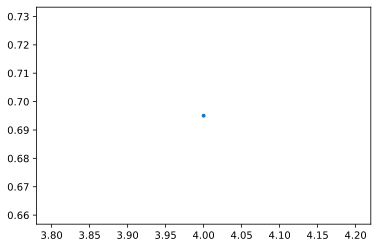

In [78]:
# NOW TRY TAKING THE DATA ONLY ONE COLUMN AT A TIME TO SEE IF WE GET BETTER ACCURACY
from lib_data import *
import scipy.io as sio
mat_contents = sio.loadmat('Exported60Node_GraphNum0.mat')
CMat = mat_contents['A']

CMat[0,33] = 0
CMat[33,0] = 0

import dut_func as dut
import time
import struct
import matplotlib
import matplotlib.pyplot as plt

from dpe import DPE
from lib_data import *
from lib_nn_dpe import NN_dpe
from IPython import display

arr = 2
dpe.N_BIT = 1

numTests = 10

#arraySizes = [4, 8, 16, 24, 32, 48, 60]
arraySizes = [4]
numArraySizes = np.size(arraySizes)
arraySTD = []

for aa in range(numArraySizes):
    currArraySize = arraySizes[aa]
    
    randomVector = np.random.randint(2, size=(currArraySize,numTests))
    appliedVector1 = np.zeros((64,numTests))
    appliedVector2 = np.zeros((64,numTests))

    appliedVector1[0:currArraySize,:] = randomVector[:,:]
    appliedVector2[0:currArraySize,:] = 1-randomVector[:,:]
    neuronVector = appliedVector1[0:60,:] - appliedVector2[0:60,:]

    output1  = dpe.multiply_w_delay(arr, appliedVector1, c_sel=[0, currArraySize], mode=1, debug=False, delay=5)
    output2  = dpe.multiply_w_delay(arr, appliedVector2, c_sel=[0, currArraySize], mode=1, debug=False, delay=5)
    all_output = np.concatenate((output1, output2))

    #SW_output = neuronVector * CMat
    #SW_neuron = np.matmul(neuronVector, CMat)
    SW_output1 = (CMat[0:currArraySize,0:currArraySize].T @ appliedVector1[0:currArraySize,:]).T 
    SW_output2 = (CMat[0:currArraySize,0:currArraySize].T @ appliedVector2[0:currArraySize,:]).T 
    all_SW_output = np.concatenate((SW_output1, SW_output2))

    lin_corrs_allcols = []
    for c in range(currArraySize):
        lin_corrs_allcols.append( np.polyfit(all_output[:,c], all_SW_output[:,c], 1))

    output_corr  = dpe.lin_corr(all_output, lin_corrs_allcols)
    output_corr1 = dpe.lin_corr(output1, lin_corrs_allcols)
    output_corr2 = dpe.lin_corr(output2, lin_corrs_allcols)
    exp_neuron_output = output_corr1 - output_corr2
    SW_neuron_output = SW_output1 - SW_output2

    #error = output_corr - all_SW_output
    #fig, ax = plt.subplots()
    #for c in range(60):
    #    x = all_SW_output[:,c]
    #    y = output_corr[:,c]    
    #    ax.plot(x,y,'.')
    #zz = np.linspace(0,30,30)  
    #ax.plot(zz,zz,'-')

    #fig, ax = plt.subplots()
    #ax.hist(error.flatten(),bins=60);

    #fig, ax = plt.subplots()
    #for c in range(currArraySize):
    #    x = SW_neuron_output[:,c]
    #    y = exp_neuron_output[:,c]    
    #    ax.plot(x,y,'.')   
    #zz = np.linspace(-25,25,50)    
    #ax.plot(zz,zz,'-')  

    #fig, ax = plt.subplots()
    #err_neuron = exp_neuron_output.flatten() - SW_neuron_output.flatten()
    #ax.hist(err_neuron.flatten(),bins=60);
    arraySTD.append(np.std(err_neuron.flatten()))
    
fig, ax = plt.subplots()
ax.plot(arraySizes, arraySTD, '.-')

In [79]:

#Function to run the hopfield network with only one col activated at a time
arr = 2
numCycles = 40
numTrials = 40

#startSchmidtVals = [-2, -1.75, -1.5, -1.25,  -1.0, -0.75, -0.5, -0.25, 0, +0.25, +0.5, +1.0, -4.5]
#endSchmidtVals = [-2, -1.75, -1.5, -1.25,  -1.0, -0.75, -0.5, -0.25, 0, +0.25, +0.5, +1.0, +1.4]
startSchmidtVals = [-5.5, -5.0, -4.5, -4.0, -3.5, -3.0, -2.5, -2.0, -1.75, -1.5, -1.25, -1.0, -0.75, -0.5, -0.25, -0.0, +0.25, +0.5, +0.75, +1.0, +1.4]
endSchmidtVals   = [+1.4, +1.4, +1.4, +1.4, +1.4, +1.4, +1.4, +1.4, +1.4,  +1.4,  +1.4, +1.4,  +1.4, +1.4,  +1.4, +1.4,  +1.4, +1.4,  +1.4, +1.4, +1.4]
numSchmidt = np.size(startSchmidtVals)

SchmidtCycleVector = np.zeros((numCycles,numSchmidt))

for ss in np.arange(numSchmidt):
    SchmidtCycleVector[:,ss] = np.linspace(startSchmidtVals[ss], endSchmidtVals[ss], numCycles)
    

threshold = 0
noise = 0
numCols = 60

#energyHistory = np.zeros((numCycles*numCols+1, numTrials))
appliedVector1 = np.zeros((64,numSchmidt))
appliedVector2 = np.zeros((64,numSchmidt))

neuronVectorHistory = np.zeros((60,numSchmidt, numCycles*numCols+1, numTrials))
neuronVector = np.zeros((60,numSchmidt))
columnUpdateHistory = np.zeros((1,numCycles*numCols+1, numTrials))

for tt in np.arange(numTrials):
    print('Trial number', tt)
    randomVector = np.random.randint(2, size=(60,1))
    initVector = randomVector

    for ss in np.arange(numSchmidt):
        appliedVector1[0:60,ss] = initVector[:,0]
        appliedVector2[0:60,ss] = 1-initVector[:,0]
        neuronVector[0:60,ss] = appliedVector1[0:60,ss] - appliedVector2[0:60,ss]
        neuronVectorHistory[:,ss,0,tt] = appliedVector1[0:60,ss] - appliedVector2[0:60,ss]
        
    #energyHistory[0,tt]= 0.5*np.dot(neuronVector.T, (CMat @ neuronVector))            

    for cc in np.arange(numCycles):
        randOrderColumns = np.arange(60)
        np.random.shuffle(randOrderColumns)
        
        trackCol=0
        for ii in randOrderColumns:
            output1  = dpe.multiply_w_delay(arr, appliedVector1, c_sel=[ii, ii+1], mode=1, debug=False, delay=5)
            output2  = dpe.multiply_w_delay(arr, appliedVector2, c_sel=[ii, ii+1], mode=1, debug=False, delay=5)
            output_corr = noise - dpe.lin_corr(output1, lin_corrs) + dpe.lin_corr(output2, lin_corrs)
            for ss in np.arange(numSchmidt):
                threshVector = threshold - SchmidtCycleVector[cc,ss]*neuronVector[ii,ss]
                #if (output_corr2[0,ii] >= threshVector[ii,0]):
                #if (output_corr >= threshVector[ii,0]):
                if (output_corr[ss,0] >= threshVector):
                    appliedVector1[ii,ss] = 1
                    appliedVector2[ii,ss] = 0
                    neuronVector[ii,ss] = 1
                else:
                    appliedVector1[ii,ss] = 0
                    appliedVector2[ii,ss] = 1
                    neuronVector[ii,ss] = -1
                neuronVectorHistory[:,ss,60*cc+trackCol+1,tt] = neuronVector[:,ss]
                
            columnUpdateHistory[0,60*cc+trackCol+1,tt] = ii                
            trackCol = trackCol + 1

save_workspace(vars(), note='Prober2_HNN_40cyc_50trials_RampingFixedFinalSchmidt')

Trial number 0
Trial number 1
Trial number 2
Trial number 3
Trial number 4
Trial number 5
Trial number 6
Trial number 7
Trial number 8
Trial number 9
Trial number 10
Trial number 11
Trial number 12
Trial number 13
Trial number 14
Trial number 15
Trial number 16
Trial number 17
Trial number 18
Trial number 19
Trial number 20
Trial number 21
Trial number 22
Trial number 23
Trial number 24
Trial number 25
Trial number 26
Trial number 27
Trial number 28
Trial number 29
Trial number 30
Trial number 31
Trial number 32
Trial number 33
Trial number 34
Trial number 35
Trial number 36
Trial number 37
Trial number 38
Trial number 39
Saving In(<class 'list'>), Out(<class 'dict'>), PIC_PINS(<class 'dict'>), DAC_CH(<class 'dict'>), DAC_SPAN(<class 'dict'>), REFCLKO(<class 'dict'>), mat_contents(<class 'dict'>), CMat(<class 'numpy.ndarray'>), arr(<class 'int'>), numTests(<class 'int'>), appliedVector1(<class 'numpy.ndarray'>), appliedVector2(<class 'numpy.ndarray'>), randomVector(<class 'numpy.ndarra

In [80]:

#Function to run the hopfield network with only one col activated at a time
arr = 2
numCycles = 20
numTrials = 100

startSchmidtVal = -3.0
endSchmidtVal   = +1.4

SchmidtCycleVector = np.linspace(startSchmidtVal, endSchmidtVal, numCycles)
    
threshold = 0
noise = 0
numCols = 60

#energyHistory = np.zeros((numCycles*numCols+1, numTrials))
appliedVector1 = np.zeros((64,numTrials))
appliedVector2 = np.zeros((64,numTrials))

neuronVectorHistory = np.zeros((60,numTrials, numCycles*numCols+1))
neuronVector = np.zeros((60,numTrials))
columnUpdateHistory = np.zeros((1,numCycles*numCols+1))

for tt in np.arange(numTrials):    
    randomVector = np.random.randint(2, size=(60,1))
    initVector = randomVector

    #for ss in np.arange(numSchmidt):
    appliedVector1[0:60,tt] = initVector[:,0]
    appliedVector2[0:60,tt] = 1-initVector[:,0]
    neuronVector[0:60,tt] = appliedVector1[0:60,tt] - appliedVector2[0:60,tt]
    neuronVectorHistory[:,tt,0] = appliedVector1[0:60,tt] - appliedVector2[0:60,tt]
        
    #energyHistory[0,tt]= 0.5*np.dot(neuronVector.T, (CMat @ neuronVector))                         

for cc in np.arange(numCycles):
    print('Cycle number', cc)
    randOrderColumns = np.arange(60)
    np.random.shuffle(randOrderColumns)

    trackCol=0
    for ii in randOrderColumns:
        output1  = dpe.multiply_w_delay(arr, appliedVector1, c_sel=[ii, ii+1], mode=1, debug=False, delay=5)
        output2  = dpe.multiply_w_delay(arr, appliedVector2, c_sel=[ii, ii+1], mode=1, debug=False, delay=5)
        output_corr = noise - dpe.lin_corr(output1, lin_corrs) + dpe.lin_corr(output2, lin_corrs)
        for tt in np.arange(numTrials):
            threshVector = threshold - SchmidtCycleVector[cc]*neuronVector[ii,tt]
            #if (output_corr2[0,ii] >= threshVector[ii,0]):
            #if (output_corr >= threshVector[ii,0]):
            if (output_corr[tt,0] >= threshVector):
                appliedVector1[ii,tt] = 1
                appliedVector2[ii,tt] = 0
                neuronVector[ii,tt] = 1
            else:
                appliedVector1[ii,tt] = 0
                appliedVector2[ii,tt] = 1
                neuronVector[ii,tt] = -1
            neuronVectorHistory[:,tt,60*cc+trackCol+1] = neuronVector[:,tt]

        columnUpdateHistory[0,60*cc+trackCol+1] = ii                
        trackCol = trackCol + 1
            
            
save_workspace(vars(), note='Prober2_HNN_20cyc_100trials_Neg3_0Pos1_4')

Cycle number 0
Cycle number 1
Cycle number 2
Cycle number 3
Cycle number 4
Cycle number 5
Cycle number 6
Cycle number 7
Cycle number 8
Cycle number 9
Cycle number 10
Cycle number 11
Cycle number 12
Cycle number 13
Cycle number 14
Cycle number 15
Cycle number 16
Cycle number 17
Cycle number 18
Cycle number 19
Saving In(<class 'list'>), Out(<class 'dict'>), PIC_PINS(<class 'dict'>), DAC_CH(<class 'dict'>), DAC_SPAN(<class 'dict'>), REFCLKO(<class 'dict'>), mat_contents(<class 'dict'>), CMat(<class 'numpy.ndarray'>), arr(<class 'int'>), numTests(<class 'int'>), appliedVector1(<class 'numpy.ndarray'>), appliedVector2(<class 'numpy.ndarray'>), randomVector(<class 'numpy.ndarray'>), neuronVector(<class 'numpy.ndarray'>), output1(<class 'numpy.ndarray'>), output2(<class 'numpy.ndarray'>), all_output(<class 'numpy.ndarray'>), SW_output1(<class 'numpy.ndarray'>), SW_output2(<class 'numpy.ndarray'>), all_SW_output(<class 'numpy.ndarray'>), lin_corrs(<class 'list'>), c(<class 'int'>), output_corr

In [81]:

#Function to run the hopfield network with only one col activated at a time
arr = 2
numCycles = 50
numTrials = 100

startSchmidtVal = -3.0
endSchmidtVal   = +1.4

SchmidtCycleVector = np.linspace(startSchmidtVal, endSchmidtVal, numCycles)
    
threshold = 0
noise = 0
numCols = 60

#energyHistory = np.zeros((numCycles*numCols+1, numTrials))
appliedVector1 = np.zeros((64,numTrials))
appliedVector2 = np.zeros((64,numTrials))

neuronVectorHistory = np.zeros((60,numTrials, numCycles*numCols+1))
neuronVector = np.zeros((60,numTrials))
columnUpdateHistory = np.zeros((1,numCycles*numCols+1))

for tt in np.arange(numTrials):    
    randomVector = np.random.randint(2, size=(60,1))
    initVector = randomVector

    #for ss in np.arange(numSchmidt):
    appliedVector1[0:60,tt] = initVector[:,0]
    appliedVector2[0:60,tt] = 1-initVector[:,0]
    neuronVector[0:60,tt] = appliedVector1[0:60,tt] - appliedVector2[0:60,tt]
    neuronVectorHistory[:,tt,0] = appliedVector1[0:60,tt] - appliedVector2[0:60,tt]
        
    #energyHistory[0,tt]= 0.5*np.dot(neuronVector.T, (CMat @ neuronVector))                         

for cc in np.arange(numCycles):
    print('Cycle number', cc)
    randOrderColumns = np.arange(60)
    np.random.shuffle(randOrderColumns)

    trackCol=0
    for ii in randOrderColumns:
        output1  = dpe.multiply_w_delay(arr, appliedVector1, c_sel=[ii, ii+1], mode=1, debug=False, delay=5)
        output2  = dpe.multiply_w_delay(arr, appliedVector2, c_sel=[ii, ii+1], mode=1, debug=False, delay=5)
        output_corr = noise - dpe.lin_corr(output1, lin_corrs) + dpe.lin_corr(output2, lin_corrs)
        for tt in np.arange(numTrials):
            threshVector = threshold - SchmidtCycleVector[cc]*neuronVector[ii,tt]
            #if (output_corr2[0,ii] >= threshVector[ii,0]):
            #if (output_corr >= threshVector[ii,0]):
            if (output_corr[tt,0] >= threshVector):
                appliedVector1[ii,tt] = 1
                appliedVector2[ii,tt] = 0
                neuronVector[ii,tt] = 1
            else:
                appliedVector1[ii,tt] = 0
                appliedVector2[ii,tt] = 1
                neuronVector[ii,tt] = -1
            neuronVectorHistory[:,tt,60*cc+trackCol+1] = neuronVector[:,tt]

        columnUpdateHistory[0,60*cc+trackCol+1] = ii                
        trackCol = trackCol + 1
            
            
save_workspace(vars(), note='Prober2_HNN_50cyc_100trials_Neg3_0Pos1_4')

Cycle number 0
Cycle number 1
Cycle number 2
Cycle number 3
Cycle number 4
Cycle number 5
Cycle number 6
Cycle number 7
Cycle number 8
Cycle number 9
Cycle number 10
Cycle number 11
Cycle number 12
Cycle number 13
Cycle number 14
Cycle number 15
Cycle number 16
Cycle number 17
Cycle number 18
Cycle number 19
Cycle number 20
Cycle number 21
Cycle number 22
Cycle number 23
Cycle number 24
Cycle number 25
Cycle number 26
Cycle number 27
Cycle number 28
Cycle number 29
Cycle number 30
Cycle number 31
Cycle number 32
Cycle number 33
Cycle number 34
Cycle number 35
Cycle number 36
Cycle number 37
Cycle number 38
Cycle number 39
Cycle number 40
Cycle number 41
Cycle number 42
Cycle number 43
Cycle number 44
Cycle number 45
Cycle number 46
Cycle number 47
Cycle number 48
Cycle number 49
Saving In(<class 'list'>), Out(<class 'dict'>), PIC_PINS(<class 'dict'>), DAC_CH(<class 'dict'>), DAC_SPAN(<class 'dict'>), REFCLKO(<class 'dict'>), mat_contents(<class 'dict'>), CMat(<class 'numpy.ndarray'>), 

In [82]:

#Function to run the hopfield network with only one col activated at a time
arr = 2
numCycles = 100
numTrials = 100

startSchmidtVal = -3.0
endSchmidtVal   = +1.4

SchmidtCycleVector = np.linspace(startSchmidtVal, endSchmidtVal, numCycles)
    
threshold = 0
noise = 0
numCols = 60

#energyHistory = np.zeros((numCycles*numCols+1, numTrials))
appliedVector1 = np.zeros((64,numTrials))
appliedVector2 = np.zeros((64,numTrials))

neuronVectorHistory = np.zeros((60,numTrials, numCycles*numCols+1))
neuronVector = np.zeros((60,numTrials))
columnUpdateHistory = np.zeros((1,numCycles*numCols+1))

for tt in np.arange(numTrials):    
    randomVector = np.random.randint(2, size=(60,1))
    initVector = randomVector

    #for ss in np.arange(numSchmidt):
    appliedVector1[0:60,tt] = initVector[:,0]
    appliedVector2[0:60,tt] = 1-initVector[:,0]
    neuronVector[0:60,tt] = appliedVector1[0:60,tt] - appliedVector2[0:60,tt]
    neuronVectorHistory[:,tt,0] = appliedVector1[0:60,tt] - appliedVector2[0:60,tt]
        
    #energyHistory[0,tt]= 0.5*np.dot(neuronVector.T, (CMat @ neuronVector))                         

for cc in np.arange(numCycles):
    print('Cycle number', cc)
    randOrderColumns = np.arange(60)
    np.random.shuffle(randOrderColumns)

    trackCol=0
    for ii in randOrderColumns:
        output1  = dpe.multiply_w_delay(arr, appliedVector1, c_sel=[ii, ii+1], mode=1, debug=False, delay=5)
        output2  = dpe.multiply_w_delay(arr, appliedVector2, c_sel=[ii, ii+1], mode=1, debug=False, delay=5)
        output_corr = noise - dpe.lin_corr(output1, lin_corrs) + dpe.lin_corr(output2, lin_corrs)
        for tt in np.arange(numTrials):
            threshVector = threshold - SchmidtCycleVector[cc]*neuronVector[ii,tt]
            #if (output_corr2[0,ii] >= threshVector[ii,0]):
            #if (output_corr >= threshVector[ii,0]):
            if (output_corr[tt,0] >= threshVector):
                appliedVector1[ii,tt] = 1
                appliedVector2[ii,tt] = 0
                neuronVector[ii,tt] = 1
            else:
                appliedVector1[ii,tt] = 0
                appliedVector2[ii,tt] = 1
                neuronVector[ii,tt] = -1
            neuronVectorHistory[:,tt,60*cc+trackCol+1] = neuronVector[:,tt]

        columnUpdateHistory[0,60*cc+trackCol+1] = ii                
        trackCol = trackCol + 1
            
            
save_workspace(vars(), note='Prober2_HNN_100cyc_100trials_Neg3_0Pos1_4')

Cycle number 0
Cycle number 1
Cycle number 2
Cycle number 3
Cycle number 4
Cycle number 5
Cycle number 6
Cycle number 7
Cycle number 8
Cycle number 9
Cycle number 10
Cycle number 11
Cycle number 12
Cycle number 13
Cycle number 14
Cycle number 15
Cycle number 16
Cycle number 17
Cycle number 18
Cycle number 19
Cycle number 20
Cycle number 21
Cycle number 22
Cycle number 23
Cycle number 24
Cycle number 25
Cycle number 26
Cycle number 27
Cycle number 28
Cycle number 29
Cycle number 30
Cycle number 31
Cycle number 32
Cycle number 33
Cycle number 34
Cycle number 35
Cycle number 36
Cycle number 37
Cycle number 38
Cycle number 39
Cycle number 40
Cycle number 41
Cycle number 42
Cycle number 43
Cycle number 44
Cycle number 45
Cycle number 46
Cycle number 47
Cycle number 48
Cycle number 49
Cycle number 50
Cycle number 51
Cycle number 52
Cycle number 53
Cycle number 54
Cycle number 55
Cycle number 56
Cycle number 57
Cycle number 58
Cycle number 59
Cycle number 60
Cycle number 61
Cycle number 62
Cy

In [83]:

#Function to run the hopfield network with only one col activated at a time
arr = 2
numCycles = 15
numTrials = 100

startSchmidtVal = -3.0
endSchmidtVal   = +1.4

SchmidtCycleVector = np.linspace(startSchmidtVal, endSchmidtVal, numCycles)
    
threshold = 0
noise = 0
numCols = 60

#energyHistory = np.zeros((numCycles*numCols+1, numTrials))
appliedVector1 = np.zeros((64,numTrials))
appliedVector2 = np.zeros((64,numTrials))

neuronVectorHistory = np.zeros((60,numTrials, numCycles*numCols+1))
neuronVector = np.zeros((60,numTrials))
columnUpdateHistory = np.zeros((1,numCycles*numCols+1))

for tt in np.arange(numTrials):    
    randomVector = np.random.randint(2, size=(60,1))
    initVector = randomVector

    #for ss in np.arange(numSchmidt):
    appliedVector1[0:60,tt] = initVector[:,0]
    appliedVector2[0:60,tt] = 1-initVector[:,0]
    neuronVector[0:60,tt] = appliedVector1[0:60,tt] - appliedVector2[0:60,tt]
    neuronVectorHistory[:,tt,0] = appliedVector1[0:60,tt] - appliedVector2[0:60,tt]
        
    #energyHistory[0,tt]= 0.5*np.dot(neuronVector.T, (CMat @ neuronVector))                         

for cc in np.arange(numCycles):
    print('Cycle number', cc)
    randOrderColumns = np.arange(60)
    np.random.shuffle(randOrderColumns)

    trackCol=0
    for ii in randOrderColumns:
        output1  = dpe.multiply_w_delay(arr, appliedVector1, c_sel=[ii, ii+1], mode=1, debug=False, delay=5)
        output2  = dpe.multiply_w_delay(arr, appliedVector2, c_sel=[ii, ii+1], mode=1, debug=False, delay=5)
        output_corr = noise - dpe.lin_corr(output1, lin_corrs) + dpe.lin_corr(output2, lin_corrs)
        for tt in np.arange(numTrials):
            threshVector = threshold - SchmidtCycleVector[cc]*neuronVector[ii,tt]
            #if (output_corr2[0,ii] >= threshVector[ii,0]):
            #if (output_corr >= threshVector[ii,0]):
            if (output_corr[tt,0] >= threshVector):
                appliedVector1[ii,tt] = 1
                appliedVector2[ii,tt] = 0
                neuronVector[ii,tt] = 1
            else:
                appliedVector1[ii,tt] = 0
                appliedVector2[ii,tt] = 1
                neuronVector[ii,tt] = -1
            neuronVectorHistory[:,tt,60*cc+trackCol+1] = neuronVector[:,tt]

        columnUpdateHistory[0,60*cc+trackCol+1] = ii                
        trackCol = trackCol + 1
            
            
save_workspace(vars(), note='Prober2_HNN_15cyc_100trials_Neg3_0Pos1_4')


#Function to run the hopfield network with only one col activated at a time
arr = 2
numCycles = 10
numTrials = 100

startSchmidtVal = -3.0
endSchmidtVal   = +1.4

SchmidtCycleVector = np.linspace(startSchmidtVal, endSchmidtVal, numCycles)
    
threshold = 0
noise = 0
numCols = 60

#energyHistory = np.zeros((numCycles*numCols+1, numTrials))
appliedVector1 = np.zeros((64,numTrials))
appliedVector2 = np.zeros((64,numTrials))

neuronVectorHistory = np.zeros((60,numTrials, numCycles*numCols+1))
neuronVector = np.zeros((60,numTrials))
columnUpdateHistory = np.zeros((1,numCycles*numCols+1))

for tt in np.arange(numTrials):    
    randomVector = np.random.randint(2, size=(60,1))
    initVector = randomVector

    #for ss in np.arange(numSchmidt):
    appliedVector1[0:60,tt] = initVector[:,0]
    appliedVector2[0:60,tt] = 1-initVector[:,0]
    neuronVector[0:60,tt] = appliedVector1[0:60,tt] - appliedVector2[0:60,tt]
    neuronVectorHistory[:,tt,0] = appliedVector1[0:60,tt] - appliedVector2[0:60,tt]
        
    #energyHistory[0,tt]= 0.5*np.dot(neuronVector.T, (CMat @ neuronVector))                         

for cc in np.arange(numCycles):
    print('Cycle number', cc)
    randOrderColumns = np.arange(60)
    np.random.shuffle(randOrderColumns)

    trackCol=0
    for ii in randOrderColumns:
        output1  = dpe.multiply_w_delay(arr, appliedVector1, c_sel=[ii, ii+1], mode=1, debug=False, delay=5)
        output2  = dpe.multiply_w_delay(arr, appliedVector2, c_sel=[ii, ii+1], mode=1, debug=False, delay=5)
        output_corr = noise - dpe.lin_corr(output1, lin_corrs) + dpe.lin_corr(output2, lin_corrs)
        for tt in np.arange(numTrials):
            threshVector = threshold - SchmidtCycleVector[cc]*neuronVector[ii,tt]
            #if (output_corr2[0,ii] >= threshVector[ii,0]):
            #if (output_corr >= threshVector[ii,0]):
            if (output_corr[tt,0] >= threshVector):
                appliedVector1[ii,tt] = 1
                appliedVector2[ii,tt] = 0
                neuronVector[ii,tt] = 1
            else:
                appliedVector1[ii,tt] = 0
                appliedVector2[ii,tt] = 1
                neuronVector[ii,tt] = -1
            neuronVectorHistory[:,tt,60*cc+trackCol+1] = neuronVector[:,tt]

        columnUpdateHistory[0,60*cc+trackCol+1] = ii                
        trackCol = trackCol + 1
            
            
save_workspace(vars(), note='Prober2_HNN_10cyc_100trials_Neg3_0Pos1_4')



#Function to run the hopfield network with only one col activated at a time
arr = 2
numCycles = 5
numTrials = 100

startSchmidtVal = -3.0
endSchmidtVal   = +1.4

SchmidtCycleVector = np.linspace(startSchmidtVal, endSchmidtVal, numCycles)
    
threshold = 0
noise = 0
numCols = 60

#energyHistory = np.zeros((numCycles*numCols+1, numTrials))
appliedVector1 = np.zeros((64,numTrials))
appliedVector2 = np.zeros((64,numTrials))

neuronVectorHistory = np.zeros((60,numTrials, numCycles*numCols+1))
neuronVector = np.zeros((60,numTrials))
columnUpdateHistory = np.zeros((1,numCycles*numCols+1))

for tt in np.arange(numTrials):    
    randomVector = np.random.randint(2, size=(60,1))
    initVector = randomVector

    #for ss in np.arange(numSchmidt):
    appliedVector1[0:60,tt] = initVector[:,0]
    appliedVector2[0:60,tt] = 1-initVector[:,0]
    neuronVector[0:60,tt] = appliedVector1[0:60,tt] - appliedVector2[0:60,tt]
    neuronVectorHistory[:,tt,0] = appliedVector1[0:60,tt] - appliedVector2[0:60,tt]
        
    #energyHistory[0,tt]= 0.5*np.dot(neuronVector.T, (CMat @ neuronVector))                         

for cc in np.arange(numCycles):
    print('Cycle number', cc)
    randOrderColumns = np.arange(60)
    np.random.shuffle(randOrderColumns)

    trackCol=0
    for ii in randOrderColumns:
        output1  = dpe.multiply_w_delay(arr, appliedVector1, c_sel=[ii, ii+1], mode=1, debug=False, delay=5)
        output2  = dpe.multiply_w_delay(arr, appliedVector2, c_sel=[ii, ii+1], mode=1, debug=False, delay=5)
        output_corr = noise - dpe.lin_corr(output1, lin_corrs) + dpe.lin_corr(output2, lin_corrs)
        for tt in np.arange(numTrials):
            threshVector = threshold - SchmidtCycleVector[cc]*neuronVector[ii,tt]
            #if (output_corr2[0,ii] >= threshVector[ii,0]):
            #if (output_corr >= threshVector[ii,0]):
            if (output_corr[tt,0] >= threshVector):
                appliedVector1[ii,tt] = 1
                appliedVector2[ii,tt] = 0
                neuronVector[ii,tt] = 1
            else:
                appliedVector1[ii,tt] = 0
                appliedVector2[ii,tt] = 1
                neuronVector[ii,tt] = -1
            neuronVectorHistory[:,tt,60*cc+trackCol+1] = neuronVector[:,tt]

        columnUpdateHistory[0,60*cc+trackCol+1] = ii                
        trackCol = trackCol + 1
            
            
save_workspace(vars(), note='Prober2_HNN_5cyc_100trials_Neg3_0Pos1_4')


#Function to run the hopfield network with only one col activated at a time
arr = 2
numCycles = 4
numTrials = 100

startSchmidtVal = -3.0
endSchmidtVal   = +1.4

SchmidtCycleVector = np.linspace(startSchmidtVal, endSchmidtVal, numCycles)
    
threshold = 0
noise = 0
numCols = 60

#energyHistory = np.zeros((numCycles*numCols+1, numTrials))
appliedVector1 = np.zeros((64,numTrials))
appliedVector2 = np.zeros((64,numTrials))

neuronVectorHistory = np.zeros((60,numTrials, numCycles*numCols+1))
neuronVector = np.zeros((60,numTrials))
columnUpdateHistory = np.zeros((1,numCycles*numCols+1))

for tt in np.arange(numTrials):    
    randomVector = np.random.randint(2, size=(60,1))
    initVector = randomVector

    #for ss in np.arange(numSchmidt):
    appliedVector1[0:60,tt] = initVector[:,0]
    appliedVector2[0:60,tt] = 1-initVector[:,0]
    neuronVector[0:60,tt] = appliedVector1[0:60,tt] - appliedVector2[0:60,tt]
    neuronVectorHistory[:,tt,0] = appliedVector1[0:60,tt] - appliedVector2[0:60,tt]
        
    #energyHistory[0,tt]= 0.5*np.dot(neuronVector.T, (CMat @ neuronVector))                         

for cc in np.arange(numCycles):
    print('Cycle number', cc)
    randOrderColumns = np.arange(60)
    np.random.shuffle(randOrderColumns)

    trackCol=0
    for ii in randOrderColumns:
        output1  = dpe.multiply_w_delay(arr, appliedVector1, c_sel=[ii, ii+1], mode=1, debug=False, delay=5)
        output2  = dpe.multiply_w_delay(arr, appliedVector2, c_sel=[ii, ii+1], mode=1, debug=False, delay=5)
        output_corr = noise - dpe.lin_corr(output1, lin_corrs) + dpe.lin_corr(output2, lin_corrs)
        for tt in np.arange(numTrials):
            threshVector = threshold - SchmidtCycleVector[cc]*neuronVector[ii,tt]
            #if (output_corr2[0,ii] >= threshVector[ii,0]):
            #if (output_corr >= threshVector[ii,0]):
            if (output_corr[tt,0] >= threshVector):
                appliedVector1[ii,tt] = 1
                appliedVector2[ii,tt] = 0
                neuronVector[ii,tt] = 1
            else:
                appliedVector1[ii,tt] = 0
                appliedVector2[ii,tt] = 1
                neuronVector[ii,tt] = -1
            neuronVectorHistory[:,tt,60*cc+trackCol+1] = neuronVector[:,tt]

        columnUpdateHistory[0,60*cc+trackCol+1] = ii                
        trackCol = trackCol + 1
            
            
save_workspace(vars(), note='Prober2_HNN_4cyc_100trials_Neg3_0Pos1_4')


Cycle number 0
Cycle number 1
Cycle number 2
Cycle number 3
Cycle number 4
Cycle number 5
Cycle number 6
Cycle number 7
Cycle number 8
Cycle number 9
Cycle number 10
Cycle number 11
Cycle number 12
Cycle number 13
Cycle number 14
Saving In(<class 'list'>), Out(<class 'dict'>), PIC_PINS(<class 'dict'>), DAC_CH(<class 'dict'>), DAC_SPAN(<class 'dict'>), REFCLKO(<class 'dict'>), mat_contents(<class 'dict'>), CMat(<class 'numpy.ndarray'>), arr(<class 'int'>), numTests(<class 'int'>), appliedVector1(<class 'numpy.ndarray'>), appliedVector2(<class 'numpy.ndarray'>), randomVector(<class 'numpy.ndarray'>), neuronVector(<class 'numpy.ndarray'>), output1(<class 'numpy.ndarray'>), output2(<class 'numpy.ndarray'>), all_output(<class 'numpy.ndarray'>), SW_output1(<class 'numpy.ndarray'>), SW_output2(<class 'numpy.ndarray'>), all_SW_output(<class 'numpy.ndarray'>), lin_corrs(<class 'list'>), c(<class 'int'>), output_corr(<class 'numpy.ndarray'>), output_corr1(<class 'numpy.ndarray'>), output_corr2(<